# WMT of $G_\Omega(\theta)$ and $\frac{d}{dt}M_\Omega(\theta)$
> where $\Omega$ is the surface boundary of the WWM of the MHW event in $\theta$ space

> surface terms come from ERA5/MERRA2 and `dMdt` term comes from Glorys

> [(MERRA Summary page link)](https://disc.gsfc.nasa.gov/datasets/M2T1NXOCN_5.12.4/summary) Note: This product is the only one from this database that has all four variables in one. The other products might have most of the necessary data vars except for sensible heat flux from ocean.

In [1]:
import xarray as xr
import json
import gcsfs
import numpy as np
import cmocean
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import matplotlib.pyplot as plt
from xgcm import Grid
import xgcm 
from xgcm.autogenerate import generate_grid_ds
from xhistogram.xarray import histogram
import pandas as pd

In [2]:
with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)

era23 = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/gom_updated.zarr'))
merra23 = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/MERRA2/datasets/ocean2023.zarr'))

era1022 = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/surf_ds_2010_22.zarr'))
merra_1022 = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/MERRA2/datasets/ocean2010_2022.zarr'))

In [3]:
era_hrly = xr.concat([era1022, era23], dim='time')
merra_hrly = xr.concat([merra_1022, merra23], dim='time')

In [4]:
era_hrly

<xarray.Dataset> Size: 23GB
Dimensions:    (time: 122712, latitude: 41, longitude: 113)
Coordinates:
  * latitude   (latitude) float32 164B 31.0 30.75 30.5 30.25 ... 21.5 21.25 21.0
  * longitude  (longitude) float32 452B -100.0 -99.75 -99.5 ... -72.25 -72.0
  * time       (time) datetime64[ns] 982kB 2010-01-01 ... 2023-12-31T23:00:00
Data variables:
    slhf       (time, latitude, longitude) float64 5GB dask.array<chunksize=(2374, 41, 113), meta=np.ndarray>
    sshf       (time, latitude, longitude) float64 5GB dask.array<chunksize=(2374, 41, 113), meta=np.ndarray>
    ssr        (time, latitude, longitude) float64 5GB dask.array<chunksize=(2374, 41, 113), meta=np.ndarray>
    sst        (time, latitude, longitude) float64 5GB dask.array<chunksize=(2374, 41, 113), meta=np.ndarray>
    str        (time, latitude, longitude) float64 5GB dask.array<chunksize=(2374, 41, 113), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      2024-04-21 17:02:34 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [5]:
merra_hrly

<xarray.Dataset> Size: 2GB
Dimensions:   (time: 122712, lat: 21, lon: 46)
Coordinates:
  * lat       (lat) float64 168B 21.0 21.5 22.0 22.5 ... 29.5 30.0 30.5 31.0
  * lon       (lon) float64 368B -100.0 -99.38 -98.75 ... -73.12 -72.5 -71.88
  * time      (time) datetime64[ns] 982kB 2010-01-01T00:30:00 ... 2023-12-31T...
Data variables:
    EFLUXWTR  (time, lat, lon) float32 474MB dask.array<chunksize=(14244, 3, 11), meta=np.ndarray>
    HFLUXWTR  (time, lat, lon) float32 474MB dask.array<chunksize=(14244, 3, 11), meta=np.ndarray>
    LWGNTWTR  (time, lat, lon) float32 474MB dask.array<chunksize=(14244, 3, 11), meta=np.ndarray>
    SWGNTWTR  (time, lat, lon) float32 474MB dask.array<chunksize=(14244, 3, 11), meta=np.ndarray>
    TSKINWTR  (time, lat, lon) float32 474MB dask.array<chunksize=(14244, 3, 11), meta=np.ndarray>
Attributes: (12/32)
    CDI:                               Climate Data Interface version 1.9.8 (...
    CDO:                               Climate Data Operators version 1.9.8 (...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg1_2d...
    Contact:                           http://gmao.gsfc.nasa.gov
    Conventions:                       CF-1
    DataResolution:                    0.5 x 0.625
    ...                                ...
    Title:                             MERRA2 tavg1_2d_ocn_Nx: 2d,1-Hourly,Ti...
    VersionID:                         5.12.4
    WesternmostLongitude:              -180.0
    history_L34RS:                     'Created by L34RS v1.4.3 @ NASA GES DI...
    identifier_product_doi:            10.5067/Y67YQ1L3ZZ4R
    identifier_product_doi_authority:  http://dx.doi.org/

In [6]:
## convert from J/m^2 -> W/m^2
era_wm2 = era_hrly / (60*60)
#resample to daily freq (hourly too noisy
era_daily = era_wm2.sel(longitude=slice(-100, -80)).resample(time='D').mean('time')
merra_daily = merra_hrly.sel(lon=slice(-100, -80)).resample(time='D').mean('time')
merra_daily['EFLUXWTR'] = (-merra_daily.EFLUXWTR)
merra_daily['HFLUXWTR'] = (-merra_daily.HFLUXWTR)

In [7]:
sst_era = (era_hrly.sst-273.15).resample(time='D').mean()
sst_era_sliced = sst_era.sel(longitude=slice(-100, -80))
sst_merra = (merra_daily.TSKINWTR-273.15)

era_unsorted = xr.merge([era_daily.drop_vars('sst'), sst_era_sliced])
era = era_unsorted.sortby('latitude')
merra = xr.merge([merra_daily.drop_vars('TSKINWTR'), sst_merra])

In [8]:
era.load()

<xarray.Dataset> Size: 679MB
Dimensions:    (time: 5113, latitude: 41, longitude: 81)
Coordinates:
  * latitude   (latitude) float32 164B 21.0 21.25 21.5 21.75 ... 30.5 30.75 31.0
  * longitude  (longitude) float32 324B -100.0 -99.75 -99.5 ... -80.25 -80.0
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    slhf       (time, latitude, longitude) float64 136MB -14.05 ... -380.4
    sshf       (time, latitude, longitude) float64 136MB -41.33 ... -123.3
    ssr        (time, latitude, longitude) float64 136MB 69.84 68.71 ... 145.2
    str        (time, latitude, longitude) float64 136MB -40.41 ... -140.9
    sst        (time, latitude, longitude) float64 136MB nan nan ... 21.19 23.63
Attributes:
    Conventions:  CF-1.6
    history:      2024-04-21 17:02:34 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

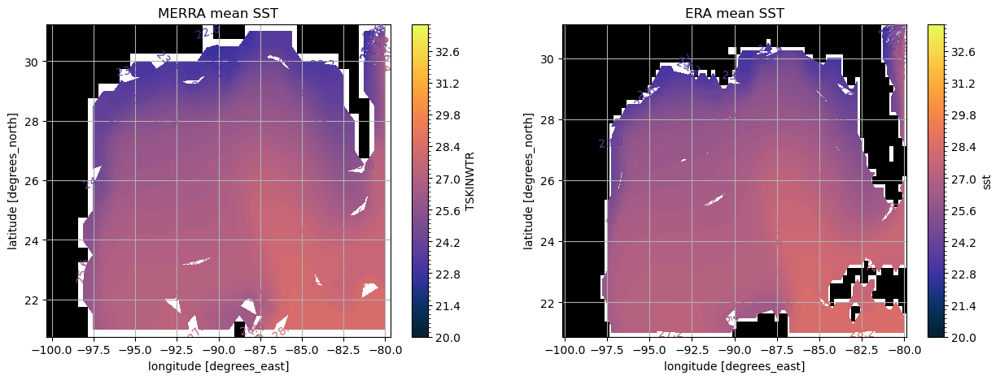

In [10]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(15,5))
mask_m = merra.TSKINWTR[0].isnull()
cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)
mask_m.plot(cmap=cmap, add_colorbar=False, ax=ax0)

c = merra.TSKINWTR.mean('time').plot.contourf(levels=np.arange(20, 34, 0.2), ax=ax0,
                                          colors=cmocean.cm.thermal, add_colorbar=True)
ax0.clabel(c)
ax0.grid()
ax0.set_title('MERRA mean SST')

mask_e = era.sst[0].isnull()
cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)
mask_e.plot(cmap=cmap, add_colorbar=False, ax=ax1)

c = era.sst.mean('time').plot.contourf(levels=np.arange(20, 34, 0.2), ax=ax1,
                                          colors=cmocean.cm.thermal, add_colorbar=True)
ax1.clabel(c)
ax1.grid()
ax1.set_title('ERA mean SST');

## Plot some things

In [10]:
def plot_timeseries(da_e, da_m, fig_title):
    plt.figure(figsize=(10,4))
    era[f'{da_e}'].mean(['latitude', 'longitude']).plot(label='ERA')
    merra[f'{da_m}'].mean(['lat', 'lon']).plot(label='MERRA')
    plt.grid()
    plt.title(f'{fig_title}')
    plt.ylabel(r'W m$^{-2}$')
    plt.xlabel('Time')
    plt.legend();

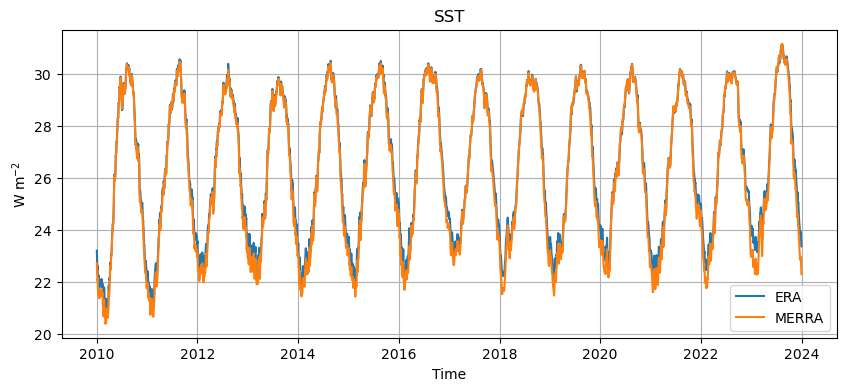

In [11]:
plot_timeseries('sst', 'TSKINWTR', 'SST')

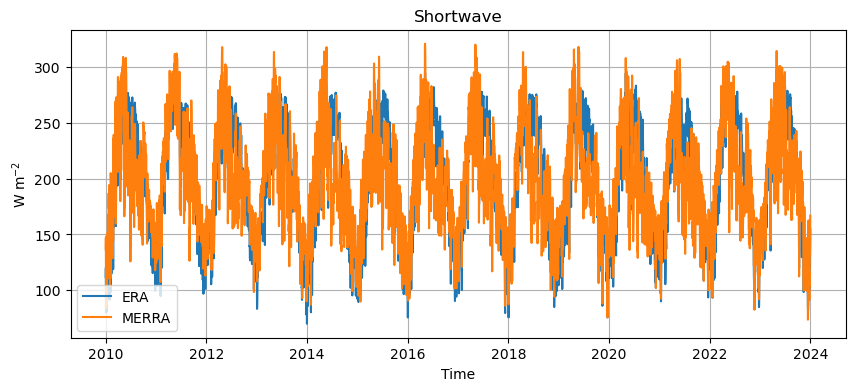

In [18]:
plot_timeseries('ssr', 'SWGNTWTR', 'Shortwave')

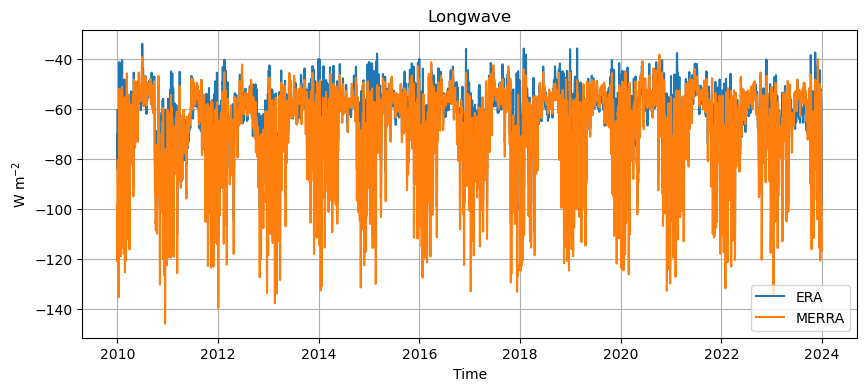

In [19]:
plot_timeseries('str', 'LWGNTWTR', 'Longwave')

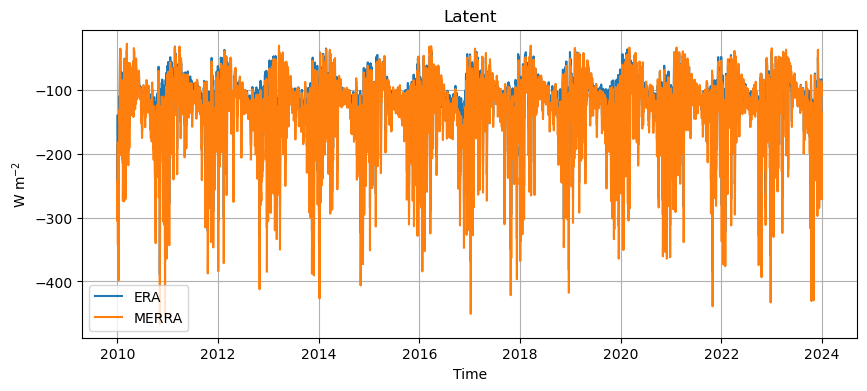

In [20]:
plot_timeseries('slhf', 'EFLUXWTR', 'Latent')

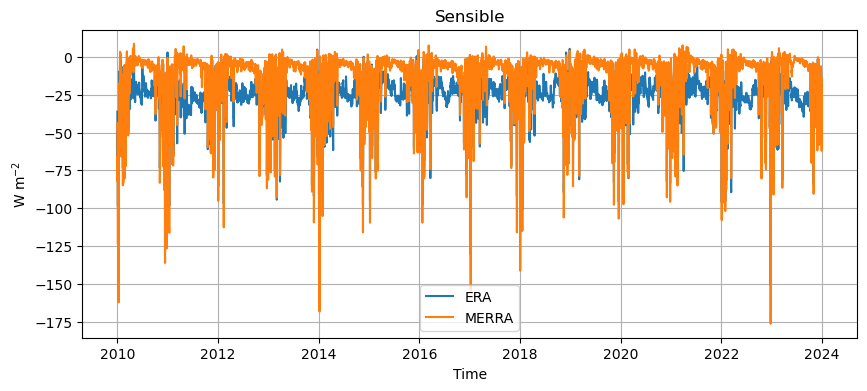

In [21]:
plot_timeseries('sshf', 'HFLUXWTR', 'Sensible')

## Create grid and area objects

In [9]:
ds_full_e = generate_grid_ds(era, {'X':'longitude', 'Y':'latitude'})
#ds_full_m = generate_grid_ds(merra, {'X':'lon', 'Y':'lat'})

In [10]:
grid_e = xgcm.Grid(ds_full_e, periodic='X')
#grid_m = xgcm.Grid(ds_full_m, periodic='X')

In [11]:
ds_full_e

<xarray.Dataset> Size: 679MB
Dimensions:         (time: 5113, latitude: 41, longitude: 81,
                     longitude_left: 81, latitude_left: 41)
Coordinates:
  * latitude        (latitude) float32 164B 21.0 21.25 21.5 ... 30.5 30.75 31.0
  * longitude       (longitude) float32 324B -100.0 -99.75 ... -80.25 -80.0
  * time            (time) datetime64[ns] 41kB 2010-01-01 ... 2023-12-31
  * longitude_left  (longitude_left) float32 324B -100.1 -99.88 ... -80.12
  * latitude_left   (latitude_left) float32 164B 20.88 21.12 ... 30.62 30.88
Data variables:
    slhf            (time, latitude, longitude) float64 136MB -14.05 ... -380.4
    sshf            (time, latitude, longitude) float64 136MB -41.33 ... -123.3
    ssr             (time, latitude, longitude) float64 136MB 69.84 ... 145.2
    str             (time, latitude, longitude) float64 136MB -40.41 ... -140.9
    sst             (time, latitude, longitude) float64 136MB nan nan ... 23.63
Attributes:
    Conventions:  CF-1.6
    history:      2024-04-21 17:02:34 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [12]:
grid_e

<xgcm.Grid>
X Axis (periodic, boundary=None):
  * center   longitude --> left
  * left     longitude_left --> center
Y Axis (periodic, boundary=None):
  * center   latitude --> left
  * left     latitude_left --> center

In [13]:
def deg_2_m(grid_obj, ds_obj, lat, lon):
    #calculating meters per latitudinal & longitudinal degree
    earth_radius = 6.371e6
    earth_circumference = 2*np.pi*earth_radius
    meters_per_degree = earth_circumference / 360
    meters_per_degree
    
    #converting lat from degrees to meters
    delta_lat = grid_obj.diff(ds_obj[f'{lat}'], 'Y', boundary='fill', fill_value=np.nan)
    dy = delta_lat * meters_per_degree
    delta_lat_l = grid_obj.diff(ds_obj[f'{lat}_left'], 'Y', boundary='fill', fill_value=np.nan)
    dy_l = delta_lat_l * meters_per_degree

    #converting degrees lon to lon [meters] (pinching at the poles)
    delta_lon = grid_obj.diff(ds_obj[f'{lon}'], 'X')#, boundary_discontinuity=360)
    dx = delta_lon * meters_per_degree * np.cos(np.deg2rad(ds_obj[f'{lat}']))
    delta_lon_l = grid_obj.diff(ds_obj[f'{lon}_left'], 'X')#, boundary_discontinuity=360)
    dx_l = delta_lon_l * meters_per_degree * np.cos(np.deg2rad(ds_obj[f'{lat}_left']))
    
    elements = xr.merge([dx.rename('dx'), dx_l.rename('dx_l'), 
                          dy.rename('dy'), dy_l.rename('dy_l')])
    
    return (elements)

In [14]:
cell_elements_e = deg_2_m(grid_e, ds_full_e, 'latitude', 'longitude')
#cell_elements_m = deg_2_m(grid_m, ds_full_m, 'lat', 'lon')

/srv/conda/envs/notebook/lib/python3.12/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg


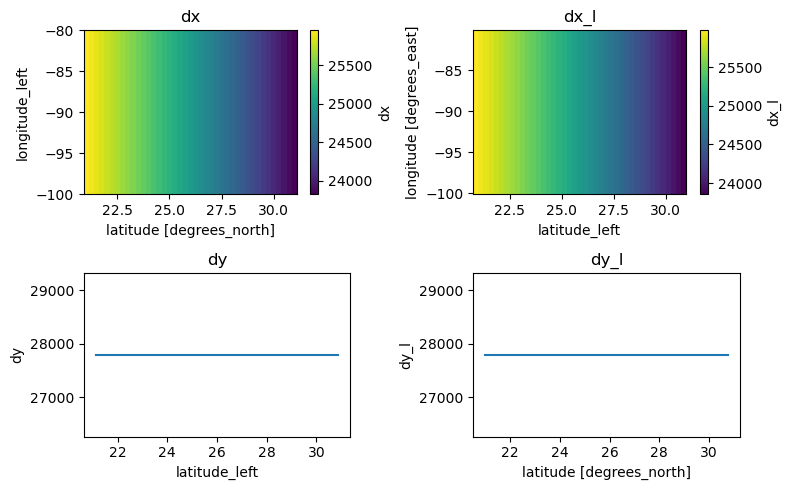

In [16]:
fig, ax = plt.subplots(2,2, figsize=(8,5))
cell_elements_e.dx[1:].plot(ax=ax[0,0])
ax[0,0].set_title('dx')
cell_elements_e.dx_l[:-1].plot(ax=ax[0,1])
ax[0,1].set_title('dx_l')
cell_elements_e.dy.plot(ax=ax[1,0])
ax[1,0].set_title('dy')
cell_elements_e.dy_l.plot(ax=ax[1,1])
ax[1,1].set_title('dy_l')
plt.tight_layout();

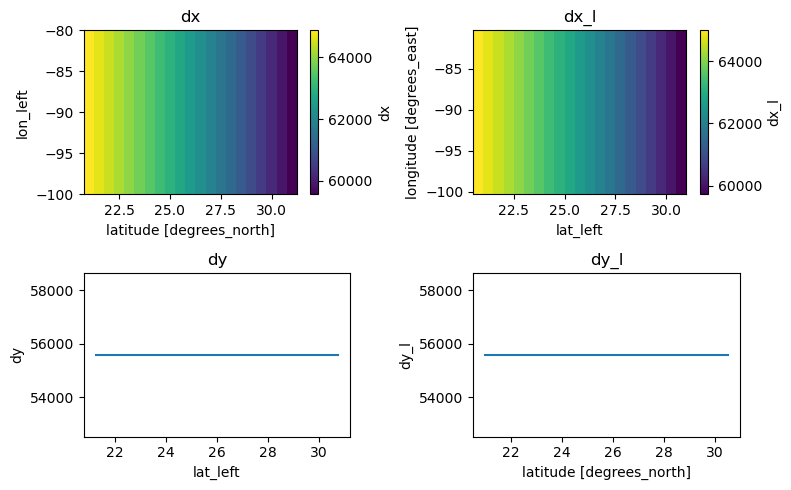

In [18]:
fig, ax = plt.subplots(2,2, figsize=(8,5))
cell_elements_m.dx[1:].plot(ax=ax[0,0])
ax[0,0].set_title('dx')
cell_elements_m.dx_l[:-1].plot(ax=ax[0,1])
ax[0,1].set_title('dx_l')
cell_elements_m.dy.plot(ax=ax[1,0])
ax[1,0].set_title('dy')
cell_elements_m.dy_l.plot(ax=ax[1,1])
ax[1,1].set_title('dy_l')
plt.tight_layout();

#### Create mask

In [15]:
mask_e = era.sst[0].isnull()
#mask_m = merra.TSKINWTR[0].isnull()

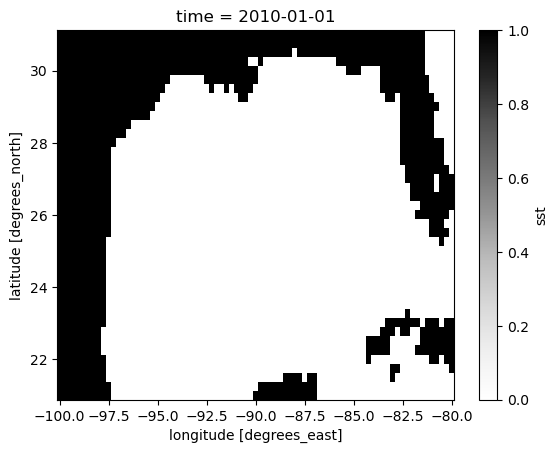

In [16]:
cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)
mask_e.plot(cmap=cmap);

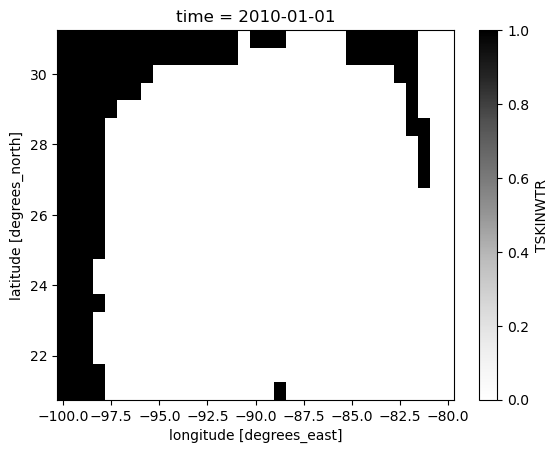

In [19]:
cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)
mask_m.plot(cmap=cmap);

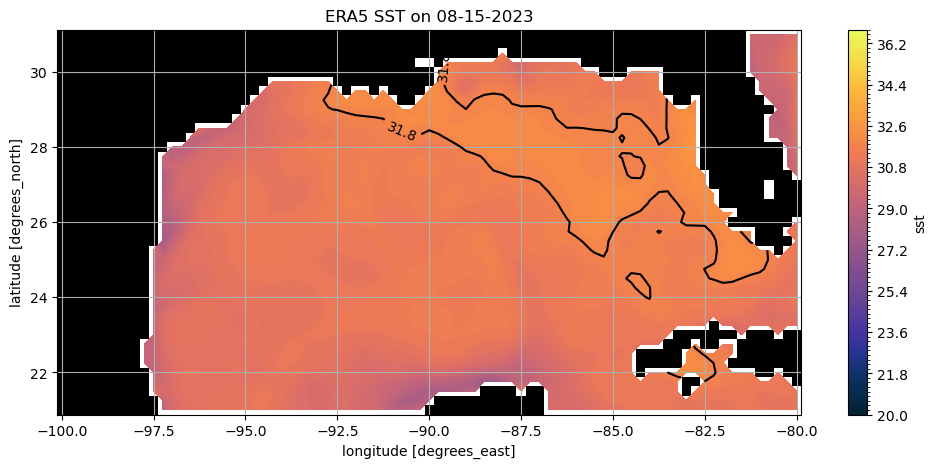

In [19]:
plt.figure(figsize=(12,5))

cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)
mask_e.plot(cmap=cmap, add_colorbar=False)

era.sst.sel(time='2023-08-15', method='nearest').plot.contourf(levels=np.arange(20, 37, 0.2), 
                                                           colors=cmocean.cm.thermal, add_colorbar=True)
c = era.sst.sel(time='2023-08-15', method='nearest').plot.contour(levels=[31.8], colors='k')
plt.clabel(c)
plt.grid()
plt.title('ERA5 SST on 08-15-2023');

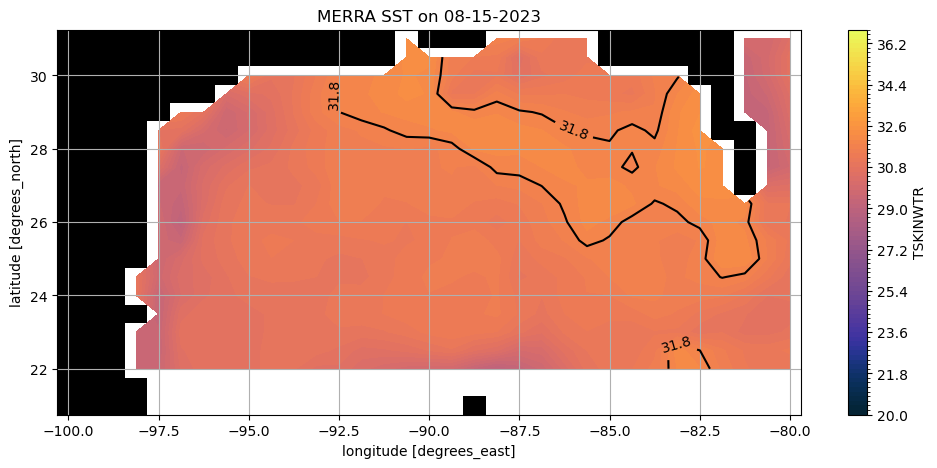

In [61]:
plt.figure(figsize=(12,5))

cmap = plt.colormaps.get_cmap("Greys")
cmap.set_bad('red', 1.)

mask_m.plot(cmap=cmap, add_colorbar=False)
merra.TSKINWTR.sel(time='2023-08-15', method='nearest').where(~mask_m).plot.contourf(levels=np.arange(20, 37, 0.2), 
                                                           colors=cmocean.cm.thermal, add_colorbar=True)
c = merra.TSKINWTR.sel(time='2023-08-15', method='nearest').plot.contour(levels=[31.8], colors='k')
plt.clabel(c)
plt.grid()
plt.title('MERRA SST on 08-15-2023');

### Calculate surface area of 31.8˚C contour

# Budget

In [16]:
dx_interp_e = grid_e.interp(cell_elements_e.dx_l, 'Y')
area_e = dx_interp_e * cell_elements_e.dy_l

#dx_interp_m = grid_m.interp(cell_elements_m.dx_l, 'Y')
#area_m = dx_interp_m * cell_elements_m.dy_l

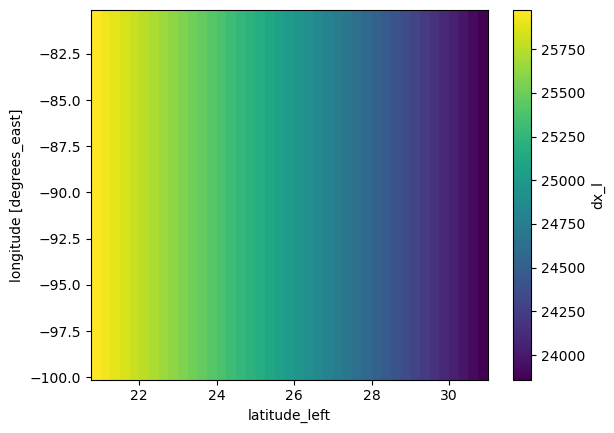

In [21]:
cell_elements_e.dx_l[:-1].plot()

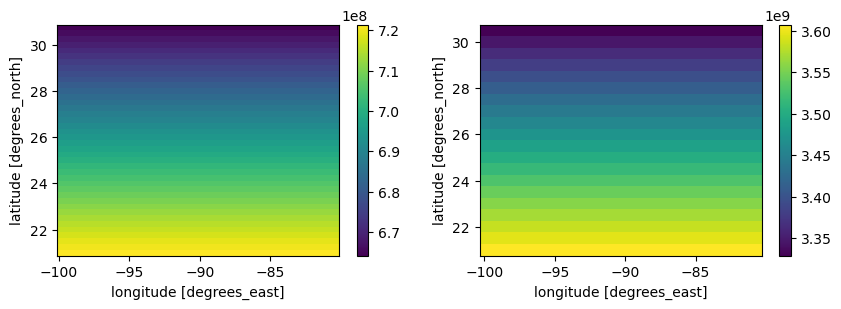

In [38]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(10,3))
area_e[:-1, :-1].T.plot(ax=ax0)
area_m[:-1, :-1].T.plot(ax=ax1)

In [17]:
Cp = heat_capacity_cp = 3.994e3 #J/kg/˚C
rho = 1027 #kg/m^3 #according to Harte Research Institute(https://www.harteresearch.org/sites/default/files/inline-files/3.pdf)

#(W/m^2) x 1/Cp x 1/rho x area
era_weighted = (era.isel(longitude=slice(None, -1), latitude=slice(None, -1)) * 
                area_e.isel(longitude=slice(None, -1), latitude=slice(None, -1)) * (1/Cp) * (1/rho)) #˚C m^3/s
#merra_weighted = (merra.isel(lon=slice(None, -1), lat=slice(None, -1)) * 
                 # area_m.isel(lon=slice(None, -1), lat=slice(None, -1)) * (1/Cp) * (1/rho)) #˚C m^3/s

In [18]:
era_weighted

<xarray.Dataset> Size: 655MB
Dimensions:    (latitude: 40, longitude: 80, time: 5113)
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    slhf       (time, latitude, longitude) float64 131MB -2.471e+03 ... -5.67...
    sshf       (time, latitude, longitude) float64 131MB -7.269e+03 ... -1.81...
    ssr        (time, latitude, longitude) float64 131MB 1.228e+04 ... 2.388e+04
    str        (time, latitude, longitude) float64 131MB -7.108e+03 ... -2.34...
    sst        (time, latitude, longitude) float64 131MB nan nan ... 3.709e+03

$$F_{PS77} = Re^{- \frac{z}{h_1}} + (1-R)e^{- \frac{z}{h_2}}$$
where $R = 0.58$, $h_1 = 0.35$ m, $h_2 = 0.23$ m (eq from Groeskamp and Iudicone 2018 GRL)

In [19]:
#bring in glorys z dim data 
#glorys = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/GOPAF/datasets/3D-pottemp.zarr'))
glorys = xr.open_zarr(gcfs_w_token.get_mapper('pangeo-tmp/stb2145/GOPAF/datasets/3D-pottemp_2010_2023.zarr'))

In [20]:
glorys

<xarray.Dataset> Size: 7GB
Dimensions:      (depth: 75, latitude: 41, longitude: 113, time: 5113)
Coordinates:
  * depth        (depth) float32 300B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude     (latitude) float32 164B 21.0 21.25 21.5 ... 30.5 30.75 31.0
  * longitude    (longitude) float32 452B -100.0 -99.75 -99.5 ... -72.25 -72.0
  * time         (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    thetao_glor  (time, depth, latitude, longitude) float32 7GB dask.array<chunksize=(640, 10, 6, 29), meta=np.ndarray>
Attributes: (12/15)
    Conventions:                   CF-1.6
    area:                          Global
    contact:                       servicedesk.cmems@mercator-ocean.eu
    copernicusmarine_version:      1.3.4
    credit:                        E.U. Copernicus Marine Service Information...
    history:                       Creation 2023-October-31 12:35:28 GMT+0200
    ...                            ...
    product:                       GLOBAL_MULTIYEAR_PHY_ENS_001_031
    product_user_manual:           http://marine.copernicus.eu/documents/PUM/...
    quality_information_document:  http://marine.copernicus.eu/documents/QUID...
    references:                    http://marine.copernicus.eu
    source:                        Copernicus Marine Service
    title:                         Daily mean fields for product GLOBAL_MULTI...

In [21]:
#Create decay function for SSR penetration
#Jerlov Type 1 (upper 50m)
R = 0.68
h1 = 1.2 #m
h2 = 28 #m
z_values = np.array([0, 5.0576001e-01, 1.5558553e+00, 2.6676817e+00, 3.8562799e+00,
       5.1403613e+00, 6.5430336e+00, 8.0925188e+00, 9.8227501e+00,
       1.1773680e+01, 1.3991038e+01, 1.6525322e+01, 1.9429802e+01,
       2.2757616e+01, 2.6558300e+01, 3.0874561e+01, 3.5740204e+01,
       4.1180023e+01, 4.7211895e+01, 5.3850636e+01, 6.1112839e+01,
       6.9021683e+01, 7.7611160e+01, 8.6929428e+01, 9.7041313e+01,
       1.0803028e+02, 1.2000000e+02, 1.3307582e+02, 1.4740625e+02,
       1.6316446e+02, 1.8054993e+02, 1.9978996e+02, 2.2114117e+02,
       2.4489062e+02, 2.7135638e+02, 3.0088751e+02, 3.3386282e+02,
       3.7068848e+02, 4.1179385e+02, 4.5762561e+02, 5.0863989e+02,
       5.6529230e+02, 6.2802600e+02, 6.9725867e+02, 7.7336829e+02,
       8.5667896e+02, 9.4744788e+02, 1.0458542e+03, 1.1519912e+03,
       1.2658615e+03, 1.3873770e+03, 1.5163636e+03, 1.6525685e+03,
       1.7956708e+03, 1.9452955e+03, 2.1010266e+03, 2.2624216e+03,
       2.4290251e+03, 2.6003804e+03, 2.7760393e+03, 2.9555703e+03,
       3.1385649e+03, 3.3246409e+03, 3.5134456e+03, 3.7046567e+03,
       3.8979819e+03, 4.0931587e+03, 4.2899526e+03, 4.4881548e+03,
       4.6875811e+03, 4.8880698e+03, 5.0894785e+03, 5.2916831e+03,
       5.4945752e+03, 5.6980605e+03, 5.9020576e+03])
z = xr.DataArray(data=z_values, dims={'depth'}, coords={'depth':z_values})
F_ps77 = R * np.exp(-z/h1) + (1-R) * np.exp(-z/h2)

#expand ssr da in z dimension then apply decay function 
ssr_Zexpanded = era_weighted.ssr.expand_dims({'depth':z}) 
ssr_z = ssr_Zexpanded * (F_ps77)

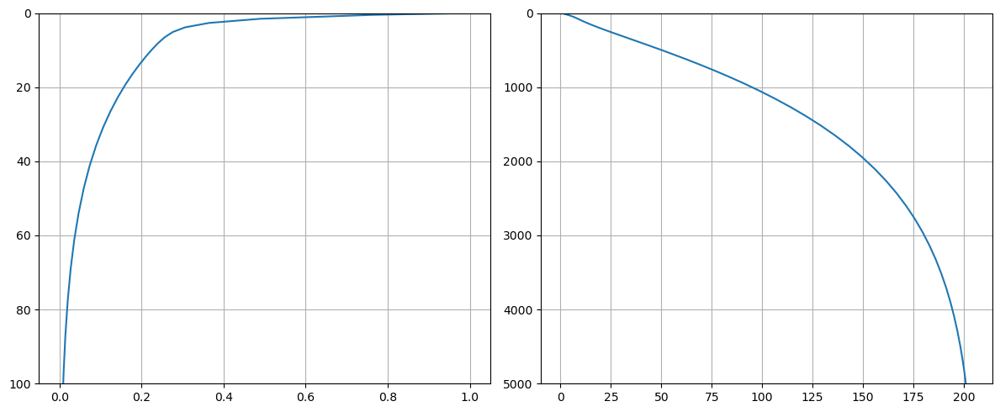

In [24]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(12,5))

ax0.plot(F_ps77, z)
ax0.set_ylim(100, 0)
ax0.grid()

ax1.plot(z.diff(dim='depth'), z.diff(dim='depth').depth)
ax1.set_ylim(5000,0)
#ax1.set_xlim(0, None)
ax1.grid()

plt.tight_layout();

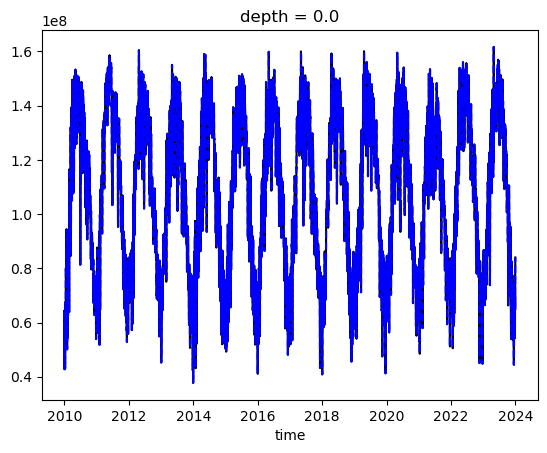

In [25]:
era_weighted.ssr.sum(['latitude', 'longitude']).plot(color='k')
ssr_z.sum(['latitude', 'longitude']).isel(depth=0).plot(color='blue', linestyle='--')

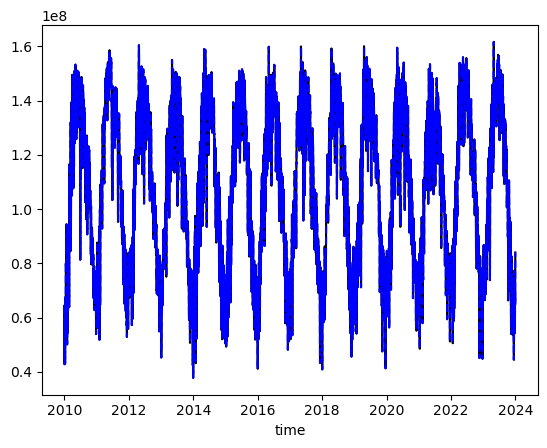

In [60]:
#ssr(z=0) - ssr(z=-1) = ssr(z=0) and original ssr da
era_weighted.ssr.sum(['latitude', 'longitude']).plot(color='k')
(ssr_z.sum(['latitude', 'longitude']).isel(depth=0) - ssr_z.sum(['latitude', 'longitude']).isel(depth=-1)).plot(color='blue', linestyle='--')

In [22]:
dFlx = ssr_z.diff(dim='depth')
dz = z.diff(dim='depth')
dFlxdz = - dFlx / dz

In [27]:
dFlxdz

<xarray.DataArray (depth: 75, time: 5113, latitude: 40, longitude: 80)> Size: 10GB
array([[[[5.81911498e+03, 5.72530575e+03, 5.79069929e+03, ...,
          1.53657150e+04, 1.54752572e+04, 1.55425772e+04],
         [7.01112556e+03, 7.02400060e+03, 7.12539820e+03, ...,
          1.51924905e+04, 1.53002455e+04, 1.53800066e+04],
         [8.41667986e+03, 8.41118664e+03, 8.42835962e+03, ...,
          1.50232104e+04, 1.51223550e+04, 1.52131798e+04],
         ...,
         [1.09891677e+04, 1.10510128e+04, 1.10307608e+04, ...,
          2.08376917e+03, 1.88684523e+03, 1.68175121e+03],
         [1.08359481e+04, 1.09052412e+04, 1.09032657e+04, ...,
          2.38046221e+03, 2.18527597e+03, 1.97255654e+03],
         [1.06360211e+04, 1.06721793e+04, 1.06715882e+04, ...,
          2.99979856e+03, 2.82516540e+03, 2.60772373e+03]],

        [[8.51453807e+03, 8.56901484e+03, 8.79436032e+03, ...,
          1.61884321e+04, 1.59082352e+04, 1.55201551e+04],
         [8.29301983e+03, 8.30621541e+03, 8.27426822e+03, ...,
          1.62120225e+04, 1.61017566e+04, 1.58448970e+04],
         [8.15764520e+03, 7.96916908e+03, 7.75744011e+03, ...,
          1.62192924e+04, 1.61777999e+04, 1.60942283e+04],
...
         [1.50595398e-87, 1.51290973e-87, 1.50958397e-87, ...,
          1.59574259e-87, 1.59431134e-87, 1.58136784e-87],
         [1.48632823e-87, 1.49468691e-87, 1.49426622e-87, ...,
          1.57346680e-87, 1.57232197e-87, 1.56517709e-87],
         [1.46077059e-87, 1.46450579e-87, 1.46390045e-87, ...,
          1.55969478e-87, 1.55994242e-87, 1.55604901e-87]],

        [[2.14050071e-87, 2.14230906e-87, 2.16811164e-87, ...,
          1.83046624e-87, 1.72499175e-87, 1.59979730e-87],
         [2.11558960e-87, 2.12422073e-87, 2.12282572e-87, ...,
          1.98627928e-87, 1.89755095e-87, 1.76874045e-87],
         [2.10871043e-87, 2.09379370e-87, 2.06778809e-87, ...,
          2.09404690e-87, 2.01486833e-87, 1.88174227e-87],
         ...,
         [1.47449409e-87, 1.48220349e-87, 1.48035047e-87, ...,
          1.62074456e-87, 1.61439727e-87, 1.59507191e-87],
         [1.45735560e-87, 1.46644532e-87, 1.46743843e-87, ...,
          1.59888079e-87, 1.59346006e-87, 1.57412888e-87],
         [1.43360617e-87, 1.43829064e-87, 1.43904731e-87, ...,
          1.58070267e-87, 1.57612138e-87, 1.56095360e-87]]]])
Coordinates:
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

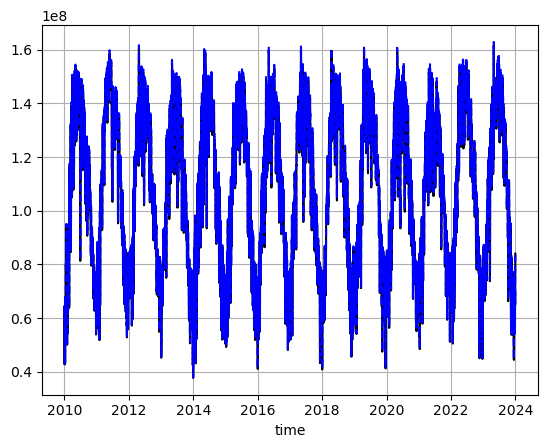

In [23]:
era_weighted.ssr.sum(['latitude', 'longitude']).plot(color='k')
dFlxdz.sum(['latitude', 'longitude', 'depth']).plot(color='blue', linestyle='--')
plt.grid()

In [24]:
sst_g = glorys.thetao_glor.sel(longitude=slice(None, -80.25), latitude=slice(None, 30.75))
#sst_ig = sst_g.interp()

In [25]:
sst_g.shape

(5113, 75, 40, 80)

In [26]:
dFlxdz.transpose('time', 'depth', 'latitude', 'longitude').shape

(5113, 75, 40, 80)

In [27]:
delta_theta = 0.1
theta_bins = np.arange(20, 38, delta_theta)

def hist_func(sst, ds, lat, lon, variable):
    hist = histogram(sst.rename('theta'), bins=[theta_bins],
                    weights=ds[variable].fillna(0.),
                    dim=[lon, lat]) / delta_theta
    return hist #m^3/s (Sv)

def hist_func_ssrz(sst, da, lat, lon, depth):
    hist_srp = histogram(sst.rename('theta'), bins=[theta_bins],
                    weights=da.fillna(0.),
                    dim=[lon, lat, depth]) / delta_theta
    return hist_srp #m^3/s (Sv)


### PDF of ssts

In [24]:
#pdf_m = histogram(merra.TSKINWTR, bins=[theta_bins], dim=['lat', 'lon']) / delta_theta
pdf_e = histogram(era.sst, bins=[theta_bins], dim=['latitude', 'longitude']) / delta_theta

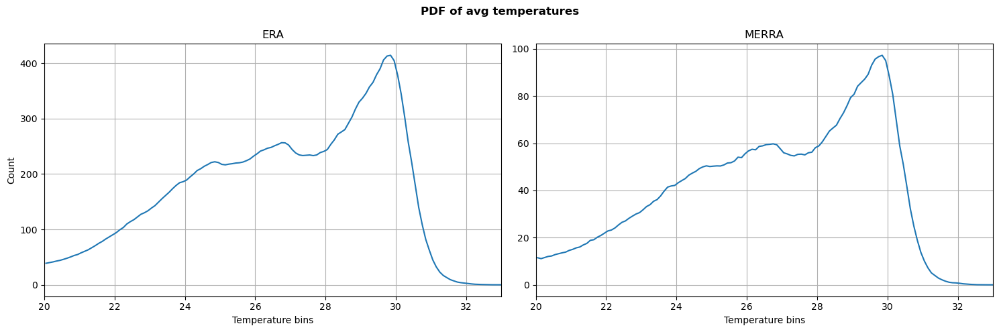

In [26]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(15,5), sharex=True)
pdf_e.mean('time').plot(ax=ax0)
ax0.grid()
ax0.set_xlim(20,33)
ax0.set_title('ERA')
ax0.set_xlabel('Temperature bins')
ax0.set_ylabel('Count')

pdf_m.mean('time').plot(ax=ax1)
ax1.grid()
ax1.set_title('MERRA')
ax1.set_xlabel('Temperature bins')
ax1.set_ylabel('')

plt.suptitle('PDF of avg temperatures', fontweight='bold')
plt.tight_layout();

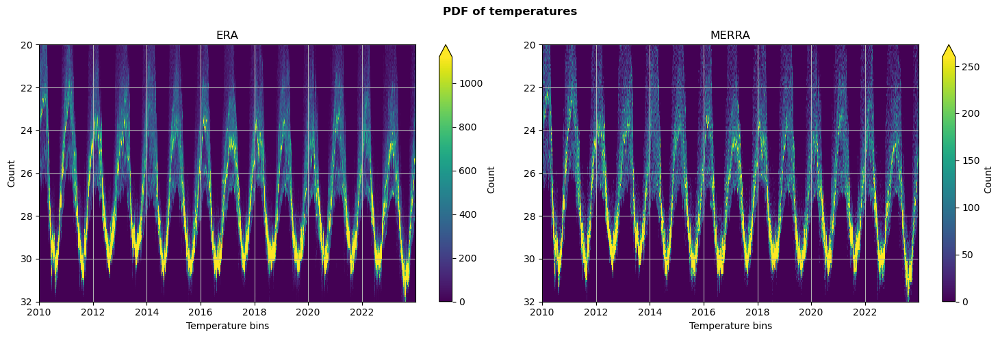

In [27]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(15,5), sharex=True)
pdf_e.plot(ax=ax0, x='time', cbar_kwargs={'label':'Count'}, robust=True)
ax0.grid()
ax0.set_ylim(32, 20)
ax0.set_title('ERA')
ax0.set_xlabel('Temperature bins')
ax0.set_ylabel('Count')

pdf_m.plot(ax=ax1, x='time', cbar_kwargs={'label':'Count'}, robust=True)
ax1.grid()
ax1.set_ylim(32, 20)
ax1.set_title('MERRA')
ax1.set_xlabel('Temperature bins')
ax1.set_ylabel('')

plt.suptitle('PDF of temperatures', fontweight='bold')
plt.tight_layout();

### Continuation of cells above before PDF section

In [28]:
era_weighted.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [29]:
era.sst.isel(longitude=slice(None, -1), latitude=slice(None, -1)).coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [124]:
sst_g.isel(depth=0).coords

Coordinates:
    depth      float32 4B 0.5058
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [30]:
sst_g.coords

Coordinates:
  * depth      (depth) float32 300B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [125]:
sst_e = era.sst.isel(longitude=slice(None, -1), latitude=slice(None, -1)).where(~mask_e)
era_hist = xr.merge([hist_func(sst_g.isel(depth=0), 
                               era_weighted.where(~mask_e),
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(era_weighted)[:-1]])
#sst_m = merra.TSKINWTR.isel(lon=slice(None, -1), lat=slice(None, -1)).where(~mask_m)
#merra_hist = xr.merge([hist_func(sst_m, 
#                                 merra_weighted.where(~mask_m),
#                                 'lat', 'lon', var).rename('omega_'+var)
#                      for var in list(merra_weighted)[:-1]])

In [40]:
sst_g.nbytes/1e9

4.90848

In [39]:
dFlxdz.nbytes/1e9

9.81696

In [43]:
mask_e

<xarray.DataArray 'sst' (latitude: 41, longitude: 81)> Size: 3kB
array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])
Coordinates:
  * latitude   (latitude) float32 164B 21.0 21.25 21.5 21.75 ... 30.5 30.75 31.0
  * longitude  (longitude) float32 324B -100.0 -99.75 -99.5 ... -80.25 -80.0
    time       datetime64[ns] 8B 2010-01-01

In [47]:
sst_g

<xarray.DataArray 'thetao_glor' (time: 5113, depth: 75, latitude: 40,
                                 longitude: 80)> Size: 5GB
dask.array<getitem, shape=(5113, 75, 40, 80), dtype=float32, chunksize=(640, 10, 6, 29), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
Attributes:
    cell_methods:   area: mean
    long_name:      Temperature
    standard_name:  sea_water_potential_temperature
    unit_long:      Degrees Celsius
    units:          degrees_C
    valid_max:      42.0
    valid_min:      -20.0

In [48]:
ssrz_hist = hist_func_ssrz(sst_g.assign_coords({'depth':dFlxdz.depth}),
                     dFlxdz.transpose('time', 'depth', 'latitude', 'longitude').where(~mask_e),
                     'latitude', 'longitude', 'depth').rename('omega_ssrz')

In [49]:
era_hist

<xarray.Dataset> Size: 29MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB -3.057e+06 -4.519e+06 ... 0.0 0.0
    omega_sshf  (time, theta_bin) float64 7MB -1.146e+06 -1.727e+06 ... 0.0 0.0
    omega_ssr   (time, theta_bin) float64 7MB 1.404e+06 1.855e+06 ... 0.0 0.0
    omega_str   (time, theta_bin) float64 7MB -1.073e+06 -1.398e+06 ... 0.0 0.0

In [50]:
ssrz_hist

<xarray.DataArray 'omega_ssrz' (time: 5113, theta_bin: 179)> Size: 7MB
dask.array<truediv, shape=(5113, 179), dtype=float64, chunksize=(74, 179), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin  (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85

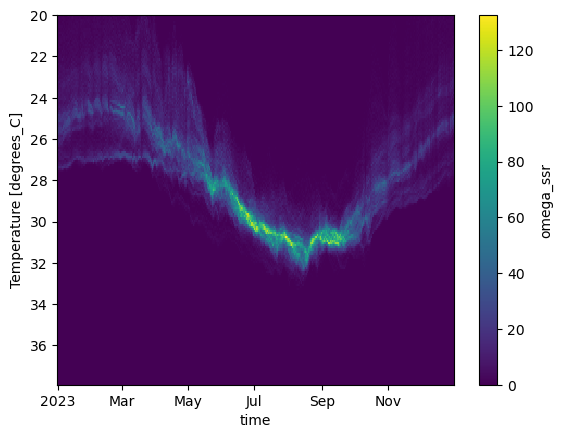

In [126]:
(era_hist.omega_ssr/1e6).sel(time=slice('2023', '2023')).T.plot(yincrease=False)

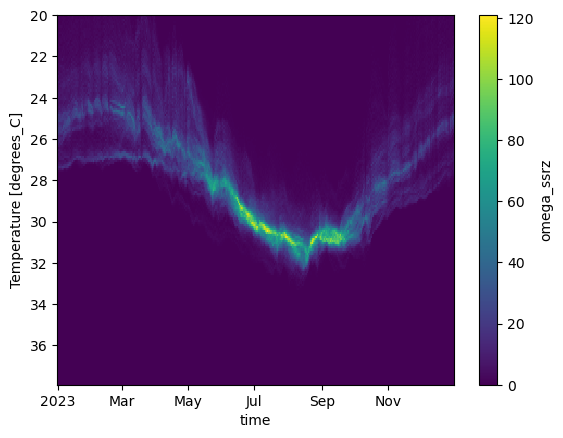

In [52]:
(ssrz_hist/1e6).sel(time=slice('2023', '2023')).T.plot(yincrease=False)

In [127]:
((ssrz_hist-era_hist.omega_ssr)/1e6).sel(time=slice('2023', '2023')).T.plot(yincrease=False)

NameError: name 'ssrz_hist' is not defined

In [59]:
ssrz_hist_ds = ssrz_hist.to_dataset(name='omega_ssrz')

In [63]:
ssrz_hist_ds.chunk({'theta_bin':-1, 'time':-1})

<xarray.Dataset> Size: 7MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_ssrz  (time, theta_bin) float64 7MB dask.array<chunksize=(5113, 179), meta=np.ndarray>

In [64]:
#upload new ssr da
import json
import gcsfs

with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)


gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/hist_dFlxdz.zarr')
ssrz_hist_ds.chunk({'theta_bin':-1, 'time':-1}).to_zarr(gcsmap_ds, mode='w')

In [66]:
#merge new ssr da into era_hist and run clim calculations for uploading new clim datasets for fig 3 in manuscript
era_hist['omega_ssrz'] = ssrz_hist

In [67]:
era_hist

<xarray.Dataset> Size: 37MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB -3.057e+06 -4.519e+06 ... 0.0 0.0
    omega_sshf  (time, theta_bin) float64 7MB -1.146e+06 -1.727e+06 ... 0.0 0.0
    omega_ssr   (time, theta_bin) float64 7MB 1.404e+06 1.855e+06 ... 0.0 0.0
    omega_str   (time, theta_bin) float64 7MB -1.073e+06 -1.398e+06 ... 0.0 0.0
    omega_ssrz  (time, theta_bin) float64 7MB dask.array<chunksize=(74, 179), meta=np.ndarray>

<Figure size 2500x500 with 0 Axes>

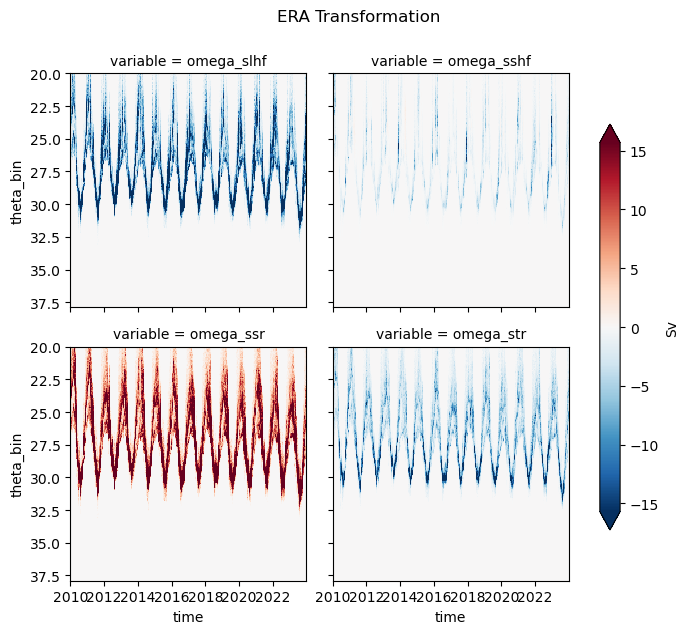

In [129]:
plt.figure(figsize=(25,5))
(era_hist/1e6).to_array().plot(col='variable', col_wrap=2, x='time', 
                               yincrease=False, robust=True, 
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('ERA Transformation', y=1.05);

<Figure size 2500x500 with 0 Axes>

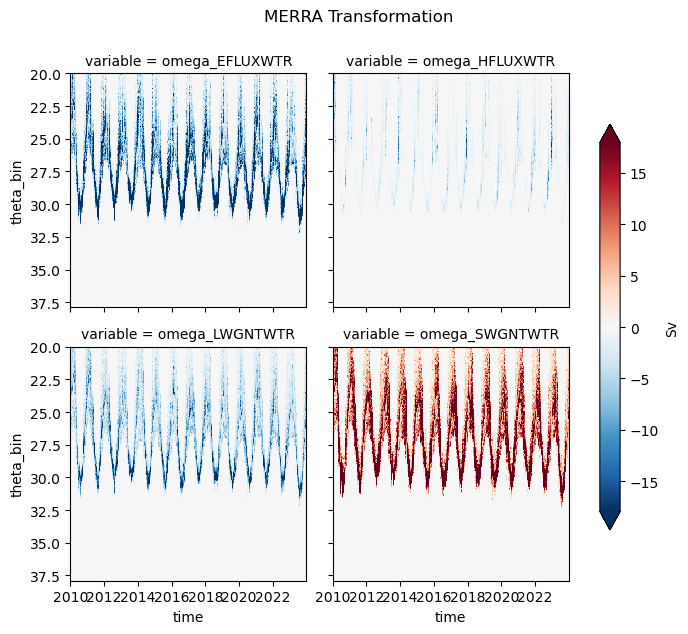

In [24]:
plt.figure(figsize=(25,5))
(merra_hist/1e6).to_array().plot(col='variable', col_wrap=2, x='time', 
                               yincrease=False, robust=True, 
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('MERRA Transformation', y=1.05);

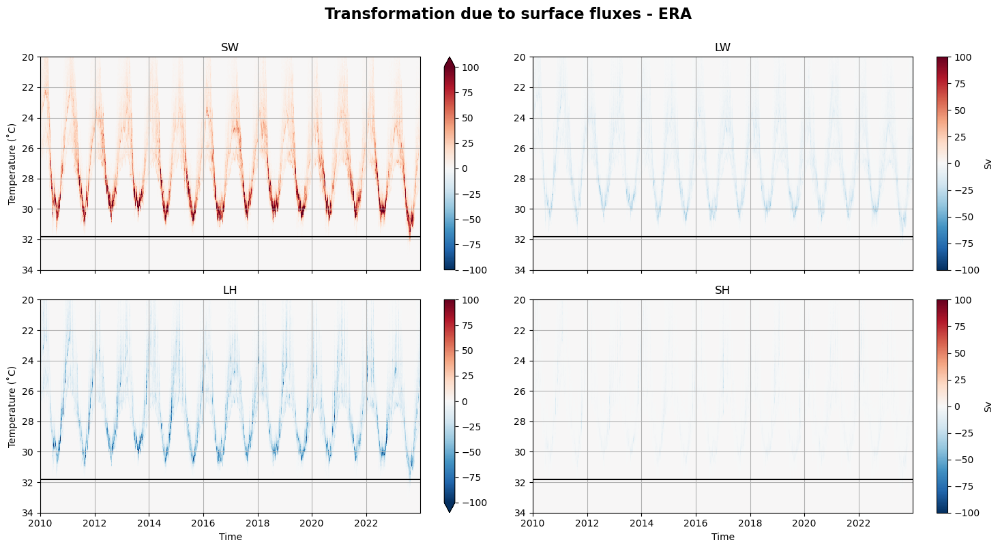

In [50]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(era_hist.omega_ssr/1e6).T.plot(label='Shortwave', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist.omega_str/1e6).T.plot(label='Longwave', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist.omega_slhf/1e6).T.plot(label='Latent Heat', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist.omega_sshf/1e6).T.plot(label='Sensisble Heat', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('Transformation due to surface fluxes - ERA', y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-era.pdf', transparent=True);

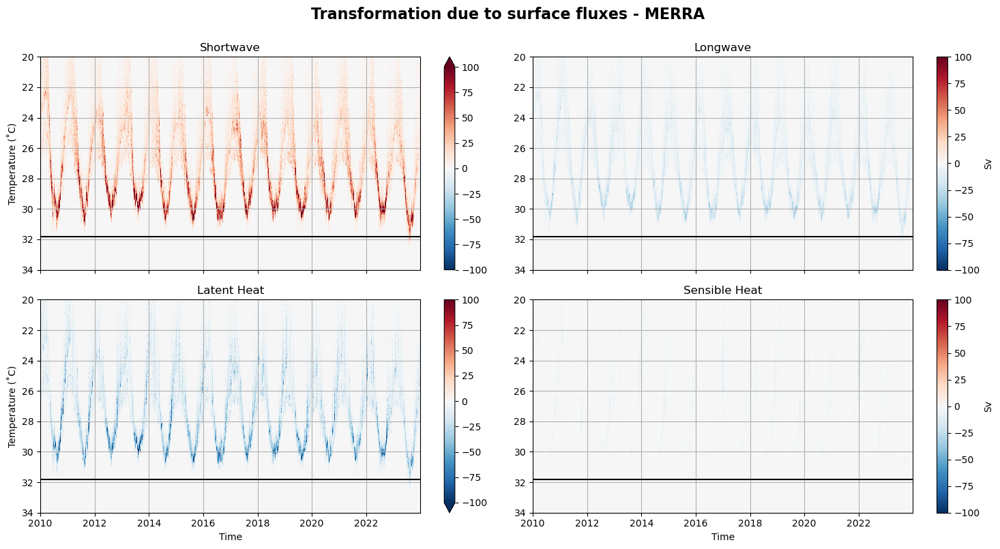

In [51]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist.omega_SWGNTWTR/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist.omega_LWGNTWTR/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist.omega_EFLUXWTR/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist.omega_HFLUXWTR/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('Transformation due to surface fluxes - MERRA', y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-merra.pdf', transparent=True);

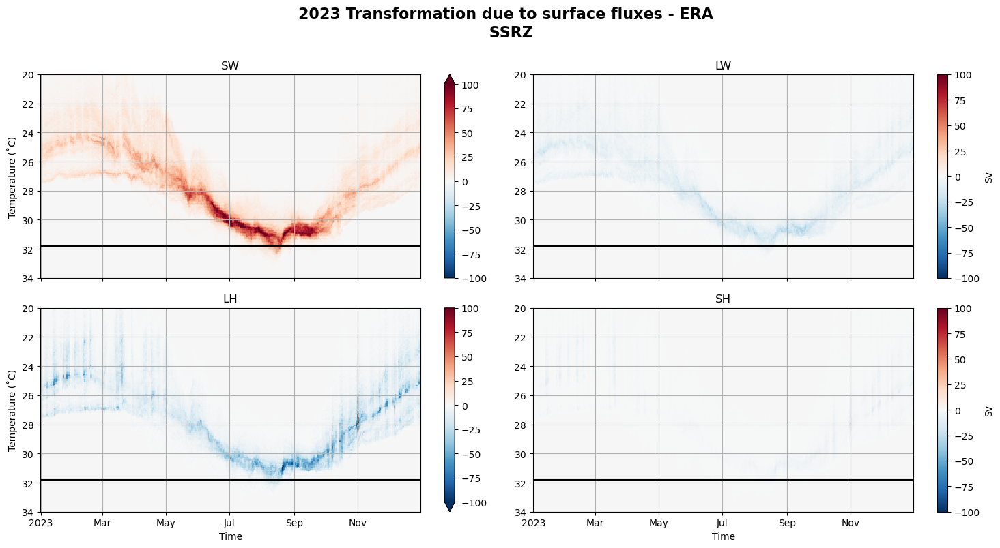

In [69]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(era_hist.omega_ssrz/1e6).sel(**year).T.plot(label='Shortwave', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist.omega_str/1e6).sel(**year).T.plot(label='Longwave', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist.omega_slhf/1e6).sel(**year).T.plot(label='Latent Heat', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist.omega_sshf/1e6).sel(**year).T.plot(label='Sensisble Heat', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('2023 Transformation due to surface fluxes - ERA \n SSRZ', y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-era.pdf', transparent=True);

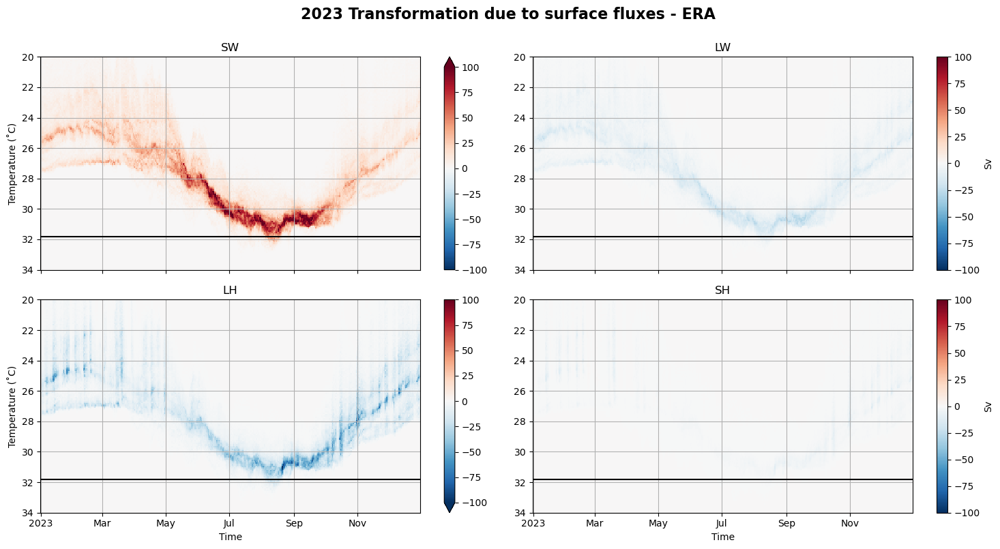

In [72]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(era_hist.omega_ssr/1e6).sel(**year).T.plot(label='Shortwave', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist.omega_str/1e6).sel(**year).T.plot(label='Longwave', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist.omega_slhf/1e6).sel(**year).T.plot(label='Latent Heat', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist.omega_sshf/1e6).sel(**year).T.plot(label='Sensisble Heat', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('2023 Transformation due to surface fluxes - ERA', y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-era.pdf', transparent=True);

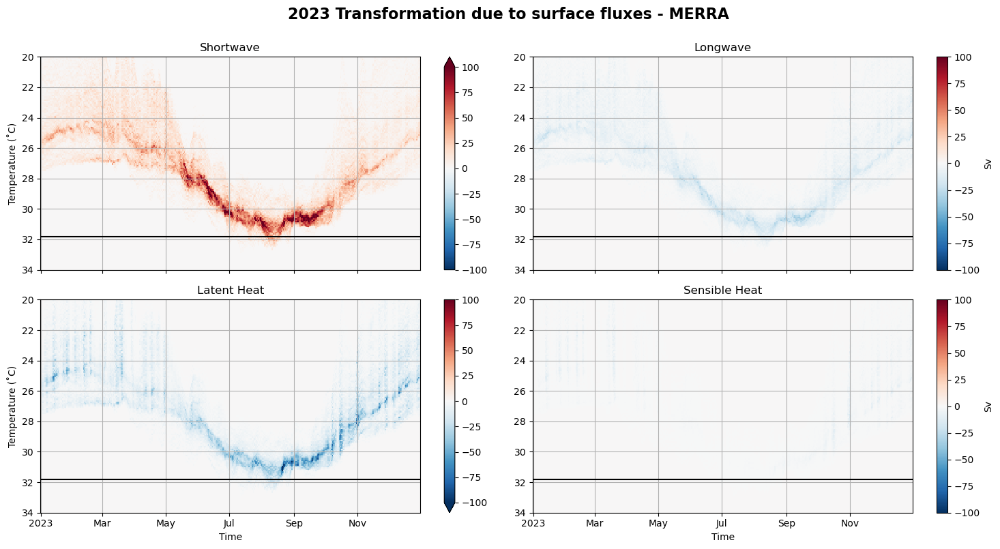

In [73]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(merra_hist.omega_SWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist.omega_LWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist.omega_EFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist.omega_HFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('2023 Transformation due to surface fluxes - MERRA', y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-merra.pdf', transparent=True);

## Insert climatological temperatures into hist function

In [54]:
mo_sst_e = sst_e.groupby('time.month').mean('time')
#mo_sst_m = sst_m.groupby('time.month').mean('time')

In [55]:
mo_sst_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * month      (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12

In [56]:
mo_sst_e.shape

(12, 40, 80)

In [57]:
era_weighted.sst.shape

(5113, 40, 80)

In [58]:
mo_sst_e_repeat = np.empty((5113,40,80))
for i in np.arange(1,13):
    mo_sst_e_repeat[np.where(era_weighted.time.dt.month.values == i)] = mo_sst_e[i-1,:,:]

#mo_sst_m_repeat = np.empty((5113,20,32))
#for i in np.arange(1,13):
#    mo_sst_m_repeat[np.where(merra_weighted.time.dt.month.values == i)] = mo_sst_m[i-1,:,:]

In [59]:
mo_sst_e_repeat.shape

(5113, 40, 80)

In [61]:
#make the sst's w repeating months as days into Data arrays
mo_sst_e_repeating = xr.DataArray(data=mo_sst_e_repeat,
                               dims=['time', 'latitude', 'longitude',],
                               coords=dict(longitude=(['longitude'], era_weighted.longitude.data),
                                            latitude=(['latitude'], era_weighted.latitude.data),
                                            time=(['time'], era_weighted.time.data)),
                                attrs=dict(description='Climatological (monthly) sea surface temperature mapped onto original time dim.',
                                            units='degC'))

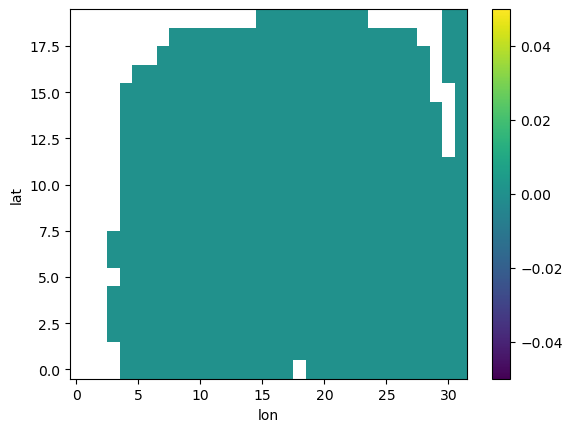

In [65]:
#checking to see if code above worked (jan1-jan30)
(mo_sst_m_repeating[0] - mo_sst_m_repeating[30]).plot()

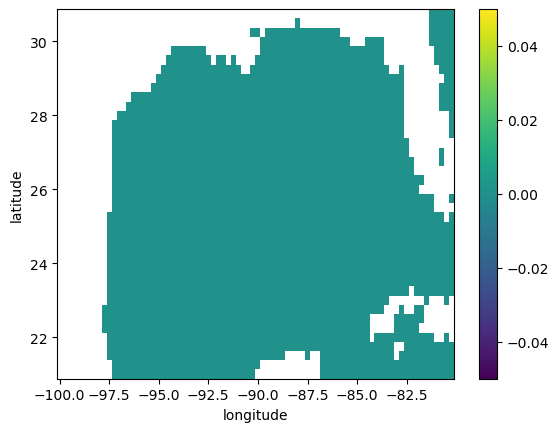

In [62]:
#checking to see if code above worked feb1-feb28
(mo_sst_e_repeating[31] - mo_sst_e_repeating[58]).plot()

In [67]:
era_weighted.where(~mask_e).coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [64]:
ssr_z.where(~mask_e).coords

Coordinates:
  * depth      (depth) float64 400B 0.0 0.494 1.541 ... 4.833e+03 5.275e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [68]:
mo_sst_e_repeating.coords

Coordinates:
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [65]:
era_hist_sst_clim = xr.merge([hist_func(mo_sst_e_repeating, 
                               era_weighted.where(~mask_e),
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(era_weighted)[:-1]])

In [72]:
ssrz_hist_sst_clim = hist_func_ssrz(mo_sst_e_repeating,
                     ssr_z.where(~mask_e),
                     'latitude', 'longitude', 'depth').rename('omega_ssrz')

In [73]:
era_hist_sst_clim

<xarray.Dataset> Size: 29MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB -3.29e+06 -2.345e+06 ... 0.0 0.0
    omega_sshf  (time, theta_bin) float64 7MB -1.21e+06 -8.541e+05 ... 0.0 0.0
    omega_ssr   (time, theta_bin) float64 7MB 1.508e+06 1.201e+06 ... 0.0 0.0
    omega_str   (time, theta_bin) float64 7MB -1.079e+06 -8.304e+05 ... 0.0 0.0

In [74]:
ssrz_hist_sst_clim

<xarray.DataArray 'omega_ssrz' (time: 5113, theta_bin: 179)> Size: 7MB
array([[ 8182398.28752224,  6518812.1781149 ,  2775739.70018217, ...,
               0.        ,        0.        ,        0.        ],
       [11874525.60151347, 10320295.88539818,  5136865.34114144, ...,
               0.        ,        0.        ,        0.        ],
       [ 7668079.99819538,  5844693.00769265,  3334511.32300113, ...,
               0.        ,        0.        ,        0.        ],
       ...,
       [14162795.81609027,  7754469.90759263,  3546806.67303049, ...,
               0.        ,        0.        ,        0.        ],
       [14984149.72764197,  8607243.06102824,  4143230.37902269, ...,
               0.        ,        0.        ,        0.        ],
       [14588306.71941758,  9391854.18696273,  4034471.60403499, ...,
               0.        ,        0.        ,        0.        ]])
Coordinates:
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin  (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85

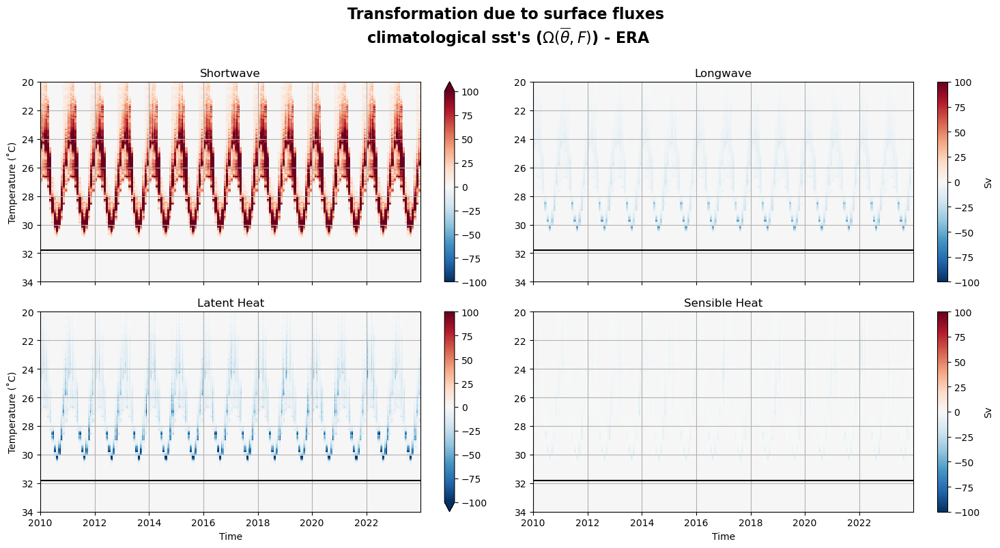

In [76]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(ssrz_hist_sst_clim/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_sst_clim.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-sst_clim-era.pdf', transparent=True);

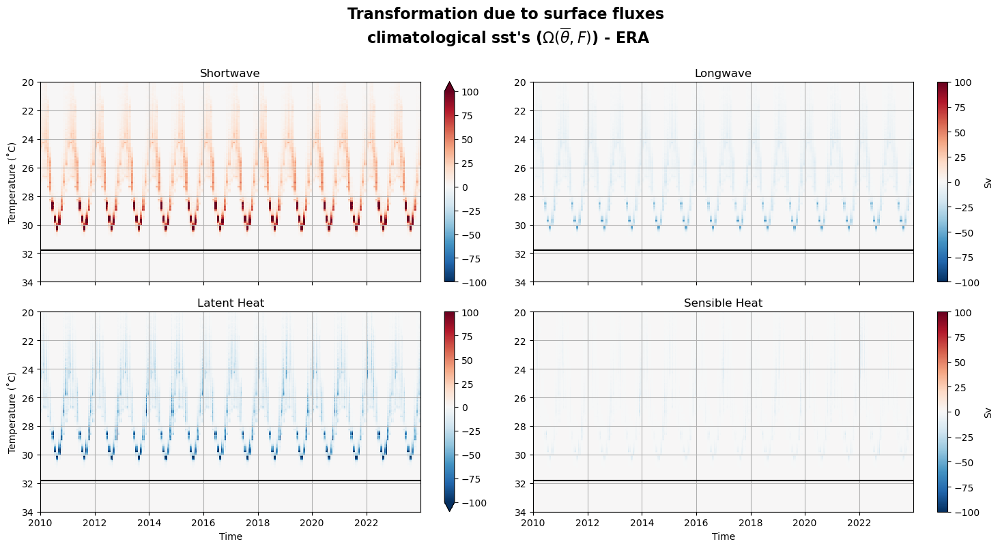

In [77]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(era_hist_sst_clim.omega_ssr/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_sst_clim.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-sst_clim-era.pdf', transparent=True);

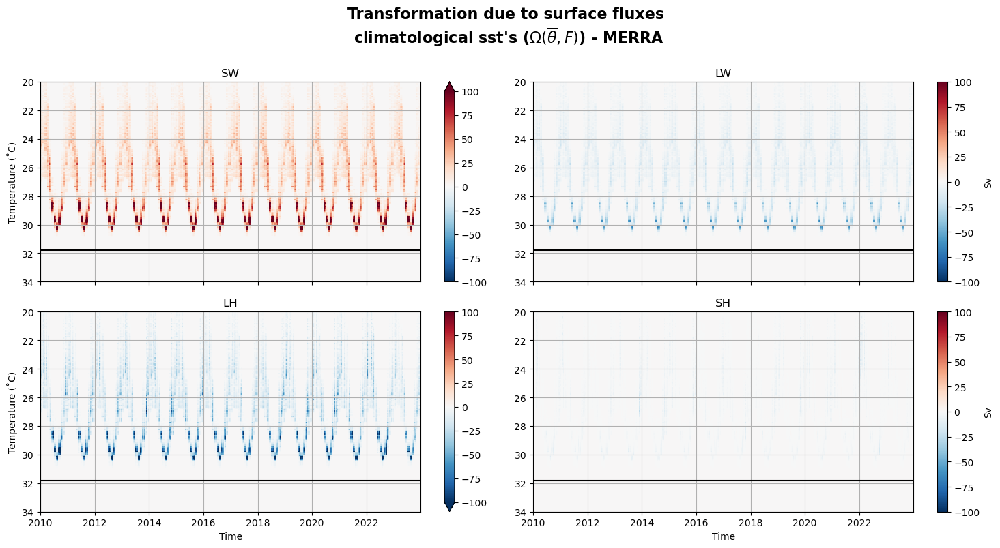

In [81]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist_sst_clim.omega_SWGNTWTR/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_LWGNTWTR/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_EFLUXWTR/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_HFLUXWTR/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-sst_clim-merra.pdf', transparent=True);

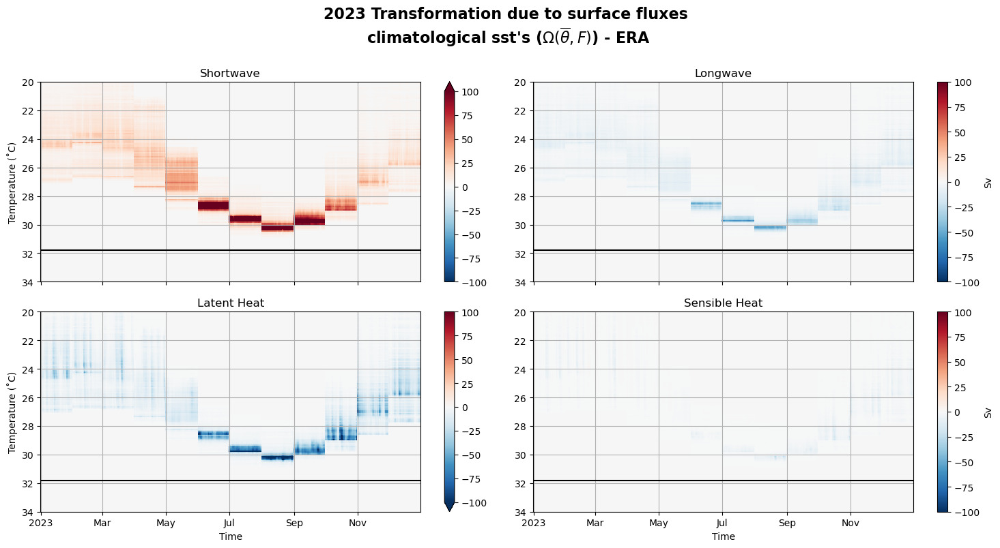

In [78]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))
(era_hist_sst_clim.omega_ssr/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_sst_clim.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-sst_clim-2023-era.pdf', transparent=True);

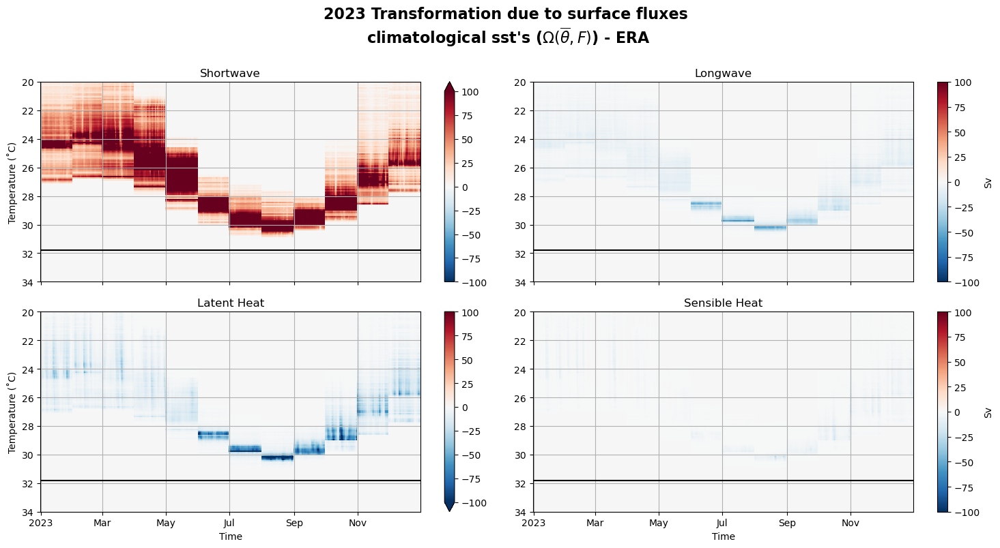

In [80]:
#ssrz instead of original ssr
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))
(ssrz_hist_sst_clim/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_sst_clim.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_sst_clim.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-2023-era.pdf', transparent=True);

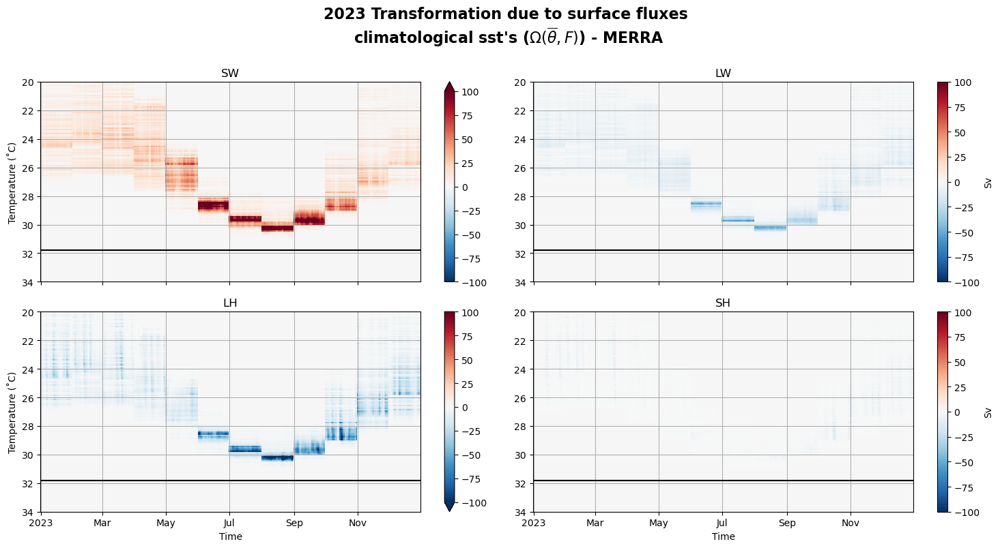

In [115]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(merra_hist_sst_clim.omega_SWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_LWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_EFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_sst_clim.omega_HFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-sst_clim-2023-merra.pdf', transparent=True);

## Insert climatological fluxes into hist function
(with time varying sst)

In [83]:
mo_flx_e1 = era_weighted.where(~mask_e).groupby('time.month').mean('time')
mo_flx_m1 = merra_weighted.where(~mask_m).groupby('time.month').mean('time')
mo_flx_e = mo_flx_e1.drop_vars('sst')
mo_flx_m = mo_flx_m1.drop_vars('TSKINWTR')

In [84]:
mo_flx_e.ssr.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * month      (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12

In [85]:
mo_flx_e.ssr.shape

(12, 40, 80)

In [87]:
sst_e.shape

(5113, 40, 80)

In [92]:
empty_flx_era = xr.Dataset(data_vars={'slhf':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'sshf':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'ssr':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'str':(['time','latitude', 'longitude'], np.empty((5113, 40, 80)))}, 
                           coords={'time':sst_e.time.dt.month.values,
                                   'latitude':sst_e.latitude,
                                   'longitude':sst_e.longitude,},
                            attrs=dict(description='Climatological (monthly) surface fluxes mapped onto original time dim.',
                                            units=r'W m$^{-2}$'))
empty_flx_merra = xr.Dataset(data_vars={'EFLUXWTR':(['time','lat', 'lon'], np.empty((5113, 20, 32))),
                                      'HFLUXWTR':(['time','lat', 'lon'], np.empty((5113, 20, 32))),
                                      'LWGNTWTR':(['time','lat', 'lon'], np.empty((5113, 20, 32))),
                                      'SWGNTWTR':(['time','lat', 'lon'], np.empty((5113, 20, 32)))}, 
                           coords={'time':sst_m.time.dt.month.values,
                                   'lat':sst_m.lat,
                                   'lon':sst_m.lon,},
                            attrs=dict(description='Climatological (monthly) surface fluxes mapped onto original time dim.',
                                            units=r'W m$^{-2}$'))

In [94]:
for i in np.arange(1,13):
    for j in list(mo_flx_e.data_vars):
        empty_flx_era[j][np.where(empty_flx_era.time.values==i)] = mo_flx_e[j][i-1,:,:]

for i in np.arange(1,13):
    for j in list(mo_flx_m.data_vars):
        empty_flx_merra[j][np.where(empty_flx_merra.time.values ==i)] = mo_flx_m[j][i-1,:,:]

In [95]:
empty_flx_era.ssr

<xarray.DataArray 'ssr' (time: 5113, latitude: 40, longitude: 80)> Size: 131MB
array([[[           nan,            nan,            nan, ...,
         30341.99822107, 30585.24675268, 30855.70390378],
        [           nan,            nan,            nan, ...,
         30599.50954607, 30853.82597851, 31147.03491639],
        [           nan,            nan,            nan, ...,
         30699.99537424, 30849.95920305, 30908.89542205],
        ...,
        [           nan,            nan,            nan, ...,
         20317.14733305, 19988.71259238, 19562.13076661],
        [           nan,            nan,            nan, ...,
         20133.84247835, 19828.07031905, 19431.20242715],
        [           nan,            nan,            nan, ...,
         19984.35901438, 19705.59415344, 19332.17407797]],

       [[           nan,            nan,            nan, ...,
         30341.99822107, 30585.24675268, 30855.70390378],
        [           nan,            nan,            nan, ...,
         30599.50954607, 30853.82597851, 31147.03491639],
        [           nan,            nan,            nan, ...,
         30699.99537424, 30849.95920305, 30908.89542205],
...
        [           nan,            nan,            nan, ...,
         18425.05055777, 18110.36378508, 17741.08230265],
        [           nan,            nan,            nan, ...,
         18130.20193104, 17829.83201888, 17482.00950148],
        [           nan,            nan,            nan, ...,
         17897.57928022, 17638.65292833, 17321.49021927]],

       [[           nan,            nan,            nan, ...,
         29097.52617725, 29369.20950278, 29626.60894193],
        [           nan,            nan,            nan, ...,
         29272.15941619, 29570.64058897, 29859.68742348],
        [           nan,            nan,            nan, ...,
         29293.57512009, 29498.88852442, 29585.40443567],
        ...,
        [           nan,            nan,            nan, ...,
         18425.05055777, 18110.36378508, 17741.08230265],
        [           nan,            nan,            nan, ...,
         18130.20193104, 17829.83201888, 17482.00950148],
        [           nan,            nan,            nan, ...,
         17897.57928022, 17638.65292833, 17321.49021927]]])
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) int64 41kB 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12

In [96]:
flx_e_repeating = empty_flx_era.assign_coords({'time':sst_e.time})
flx_m_repeating = empty_flx_merra.assign_coords({'time':sst_m.time})

In [97]:
flx_e_repeating

<xarray.Dataset> Size: 524MB
Dimensions:    (time: 5113, latitude: 40, longitude: 80)
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    slhf       (time, latitude, longitude) float64 131MB nan nan ... -3.854e+04
    sshf       (time, latitude, longitude) float64 131MB nan nan ... -9.224e+03
    ssr        (time, latitude, longitude) float64 131MB nan nan ... 1.732e+04
    str        (time, latitude, longitude) float64 131MB nan nan ... -1.369e+04
Attributes:
    description:  Climatological (monthly) surface fluxes mapped onto origina...
    units:        W m$^{-2}$

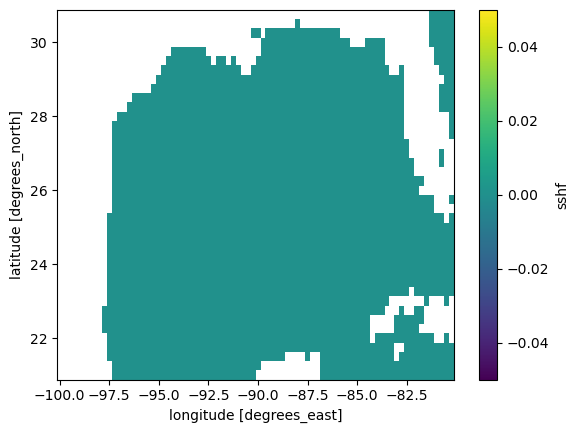

In [101]:
#checking to see if code above worked jan1-jan31
(flx_e_repeating.sshf[0] - flx_e_repeating.sshf[30]).plot()

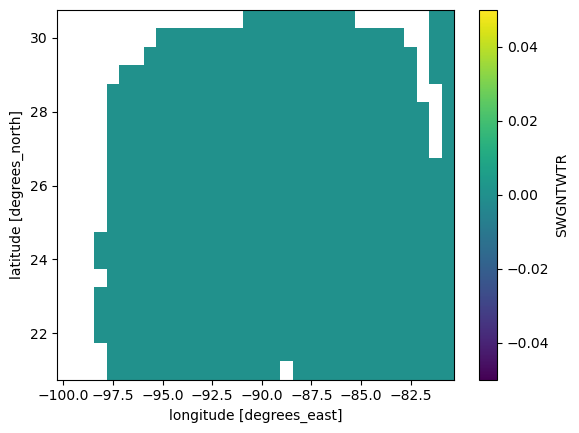

In [102]:
#checking to see if code above worked feb1-feb28
(flx_m_repeating.SWGNTWTR[31] - flx_m_repeating.SWGNTWTR[58]).plot()

In [103]:
sst_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [104]:
flx_e_repeating.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [105]:
sst_m.coords

Coordinates:
  * lat      (lat) float64 160B 21.0 21.5 22.0 22.5 23.0 ... 29.0 29.5 30.0 30.5
  * lon      (lon) float64 256B -100.0 -99.38 -98.75 ... -81.88 -81.25 -80.62
  * time     (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [106]:
flx_m_repeating.coords

Coordinates:
  * lat      (lat) float64 160B 21.0 21.5 22.0 22.5 23.0 ... 29.0 29.5 30.0 30.5
  * lon      (lon) float64 256B -100.0 -99.38 -98.75 ... -81.88 -81.25 -80.62
  * time     (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [107]:
era_hist_flx_clim = xr.merge([hist_func(sst_e, 
                               flx_e_repeating,
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(flx_e_repeating)])
merra_hist_flx_clim = xr.merge([hist_func(sst_m, 
                                 flx_m_repeating,
                                 'lat', 'lon', var).rename('omega_'+var)
                      for var in list(flx_m_repeating)])

In [108]:
era_hist_flx_clim

<xarray.Dataset> Size: 29MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB -2.32e+06 -3.386e+06 ... 0.0 0.0
    omega_sshf  (time, theta_bin) float64 7MB -6.9e+05 -9.014e+05 ... 0.0 0.0
    omega_ssr   (time, theta_bin) float64 7MB 1.904e+06 2.575e+06 ... 0.0 0.0
    omega_str   (time, theta_bin) float64 7MB -1.183e+06 -1.575e+06 ... 0.0 0.0

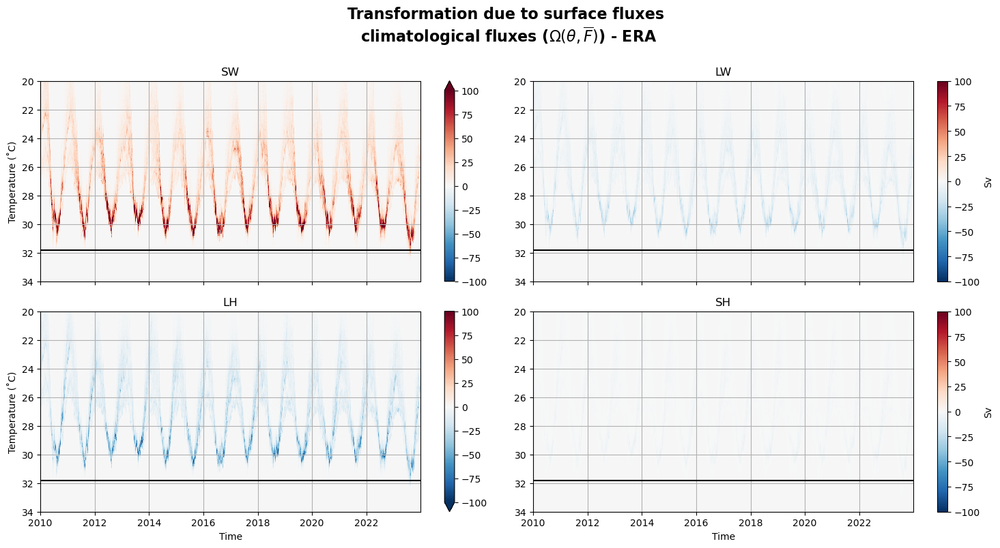

In [110]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(era_hist_flx_clim.omega_ssr/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-era.pdf', transparent=True);

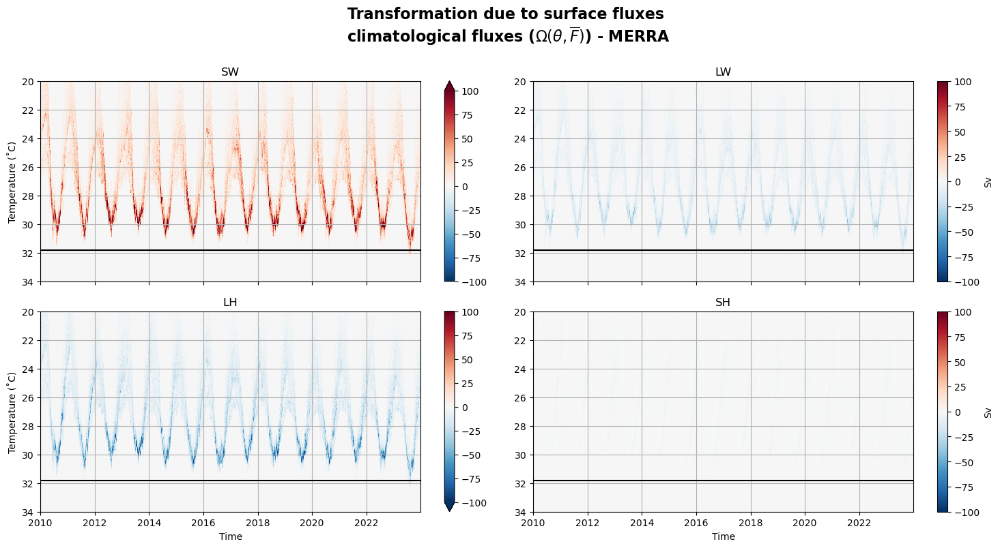

In [111]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist_flx_clim.omega_SWGNTWTR/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_LWGNTWTR/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_EFLUXWTR/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_HFLUXWTR/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-merra.pdf', transparent=True);

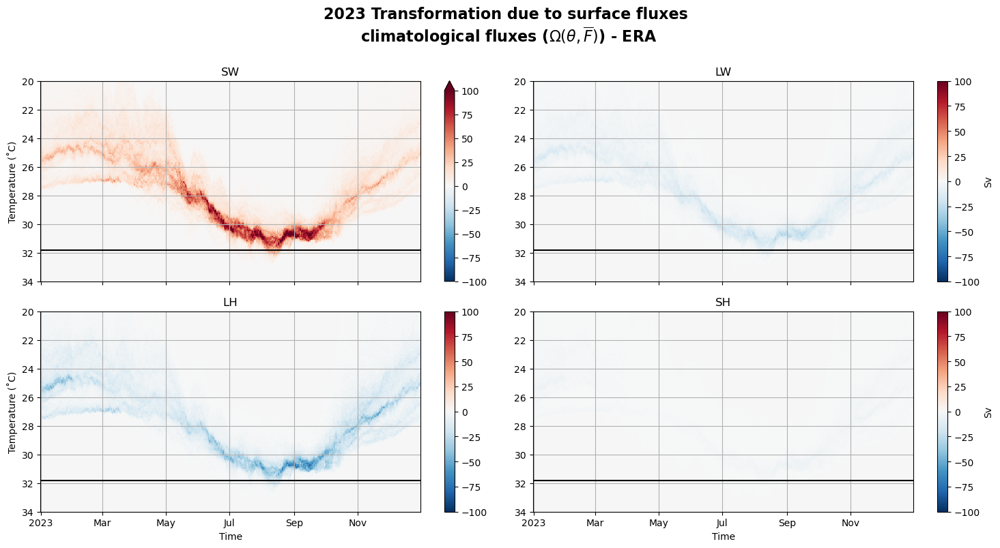

In [112]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(era_hist_flx_clim.omega_ssr/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-2023-era.pdf', transparent=True);

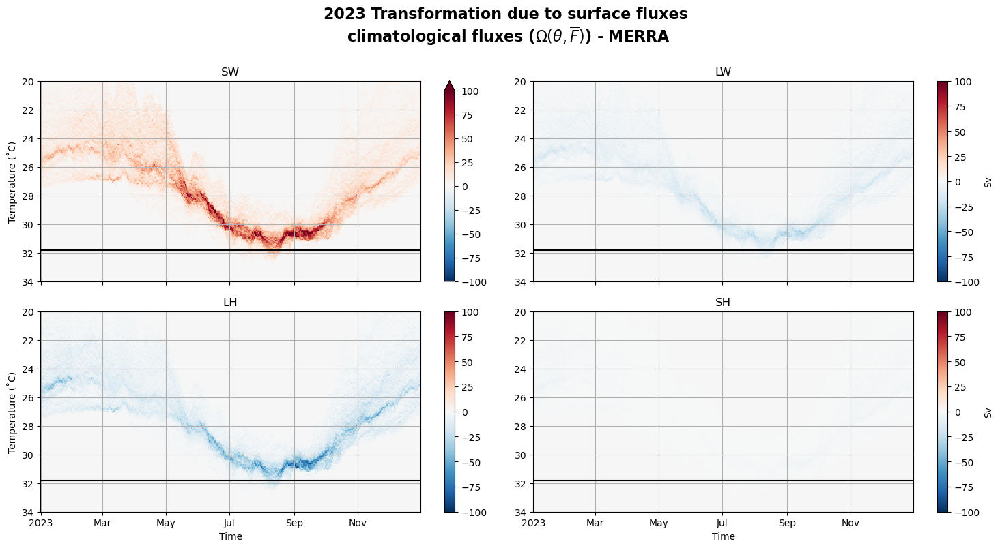

In [113]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(merra_hist_flx_clim.omega_SWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_LWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_EFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,0], vmax=100, vmin=-100,  rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_HFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-2023-merra.pdf', transparent=True);

## Monthly climatology 

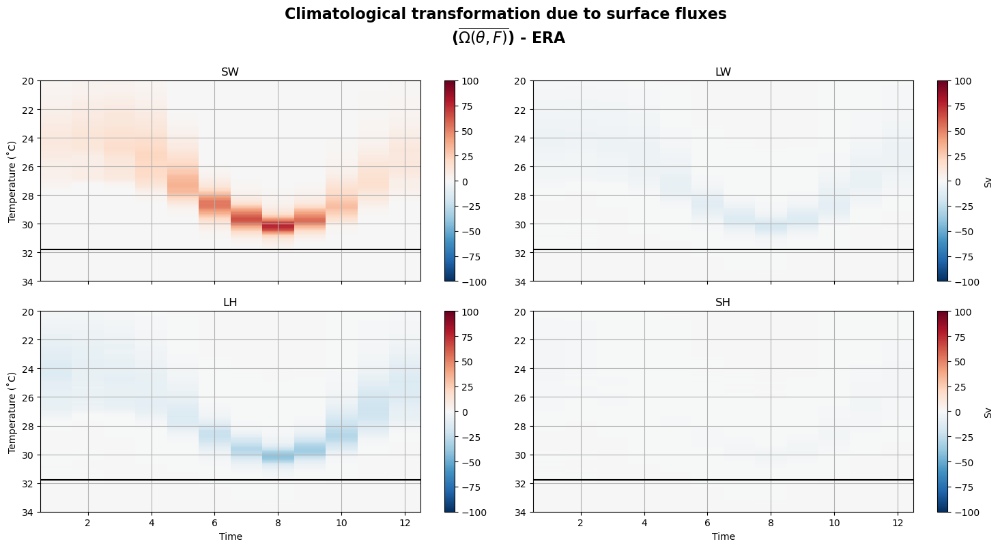

In [120]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(era_hist.omega_ssr.groupby('time.month').mean('time')/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist.omega_str.groupby('time.month').mean('time')/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist.omega_slhf.groupby('time.month').mean('time')/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist.omega_sshf.groupby('time.month').mean('time')/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Climatological transformation due to surface fluxes \n" r"($\overline{\Omega(\theta, F)}$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-clim-era.pdf', transparent=True);

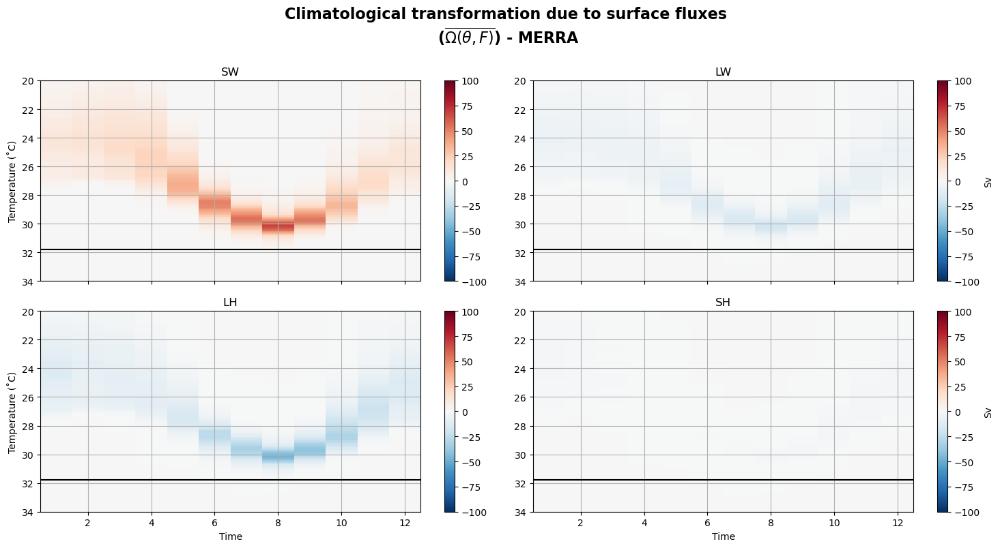

In [121]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist.omega_SWGNTWTR.groupby('time.month').mean('time')/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist.omega_LWGNTWTR.groupby('time.month').mean('time')/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist.omega_EFLUXWTR.groupby('time.month').mean('time')/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,  
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist.omega_HFLUXWTR.groupby('time.month').mean('time')/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Climatological transformation due to surface fluxes \n" r"($\overline{\Omega(\theta, F)}$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-clim-merra.pdf', transparent=True);

## Daily climatologies

## Insert daily climatological temperatures into hist function $\Omega(\overline{\theta}, F)$

In [136]:
dai_sst_e = sst_e.groupby('time.dayofyear').mean('time')
dai_sst_g = sst_g.isel(depth=0).groupby('time.dayofyear').mean('time')
#dai_sst_m = sst_m.groupby('time.dayofyear').mean('time')

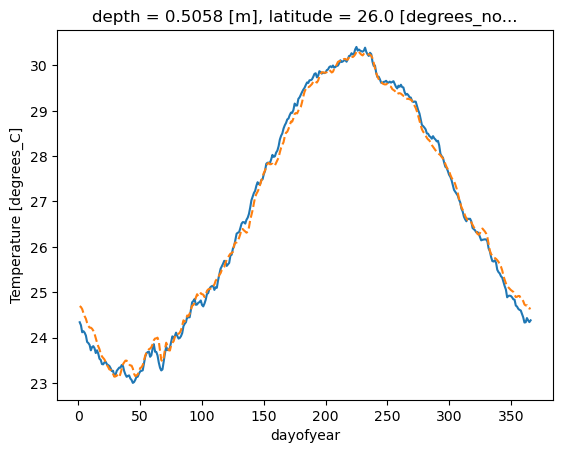

In [137]:
dai_sst_e[:, 20,-18].plot()
dai_sst_g[:, 20,-18].plot(linestyle='--')

In [116]:
dai_sst_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [117]:
dai_sst_g.coords

Coordinates:
  * depth      (depth) float32 300B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [34]:
dai_sst_e.shape

(366, 40, 80)

In [138]:
dai_sst_g.shape

(366, 40, 80)

In [36]:
era_weighted.sst.shape

(5113, 40, 80)

**Leap Years in dataset: [2012, 2016, 2020]**

In [61]:
dai_sst_e_repeat = np.empty((5113,40,80))
for i in np.arange(1,367):
    dai_sst_e_repeat[np.where(era_weighted.time.dt.dayofyear.values == i)] = dai_sst_e[i-1,:,:]

In [144]:
dai_sst_g_repeat = np.empty((5113,40,80))
for i in np.arange(1,367):
    dai_sst_g_repeat[np.where(era_weighted.time.dt.dayofyear.values == i)] = dai_sst_g[i-1,:,:]

In [87]:
dai_sst_e_repeat.shape

(5113, 40, 80)

In [87]:
dai_sst_g_repeat.shape

(5113, 40, 80)

In [62]:
#make the sst's w repeating months as days into Data arrays
dai_sst_e_repeating = xr.DataArray(data=dai_sst_e_repeat,
                               dims=['time', 'latitude', 'longitude',],
                               coords=dict(longitude=(['longitude'], era_weighted.longitude.data),
                                            latitude=(['latitude'], era_weighted.latitude.data),
                                            time=(['time'], era_weighted.time.data)),
                                attrs=dict(description='Climatological (daily) sea surface temperature mapped onto original time dim.',
                                            units='degC'))

In [145]:
#using glorys sst for rest of flux terms
dai_sst_g_repeating = xr.DataArray(data=dai_sst_g_repeat,
                               dims=['time', 'latitude', 'longitude',],
                               coords=dict(longitude=(['longitude'], sst_g.longitude.data),
                                           latitude=(['latitude'], sst_g.latitude.data),
                                           time=(['time'], sst_g.time.data)),
                                attrs=dict(description='Climatological (daily) sea surface temperature mapped onto original time dim.',
                                            units='degC'))

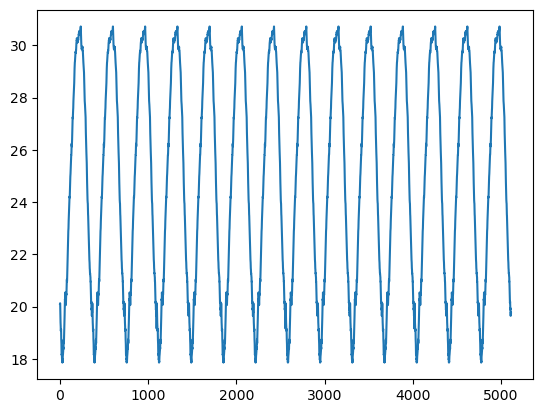

In [89]:
plt.plot(dai_sst_e_repeat[:, 25,70])

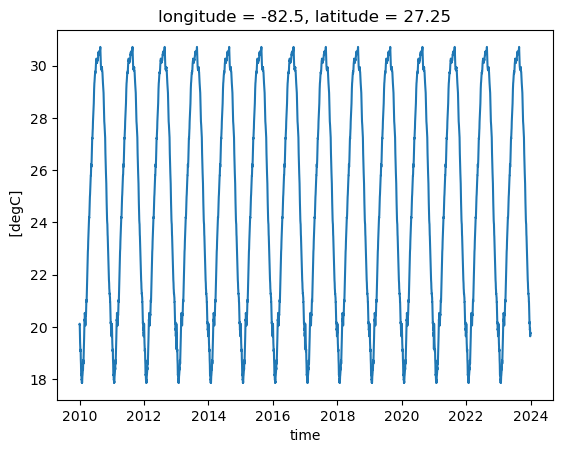

In [90]:
dai_sst_e_repeating[:, 25,70].plot()

In [91]:
era_weighted.where(~mask_e).coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [92]:
dai_sst_e_repeating.coords

Coordinates:
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [94]:
ssr_z.where(~mask_e).coords

Coordinates:
  * depth      (depth) float64 400B 0.0 0.494 1.541 ... 4.833e+03 5.275e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [146]:
hist_sst_dai_clim_e = xr.merge([hist_func(dai_sst_g_repeating, 
                               era_weighted.where(~mask_e),
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(era_weighted)[:-1]])

In [84]:
hist_sst_dai_clim_e_ssrz = hist_func_ssrz(dai_sst_e_repeating,
                     dFlxdz.where(~mask_e),
                     'latitude', 'longitude', 'depth').rename('omega_ssrz')

In [66]:
np.array_equal(dai_sst_g_repeating.dai_sst_g_repeating.depth.values, dFlxdz.depth.values)

False

In [69]:
hist_sst_dai_clim_g_ssrz = hist_func_ssrz(dai_sst_g_repeating.dai_sst_g_repeating, 
                                          dFlxdz.assign_coords({'depth':dai_sst_g_repeating.depth}).transpose('time', 'depth', 'latitude', 'longitude'),
                                          'latitude', 'longitude', 'depth').rename('omega_ssrz')

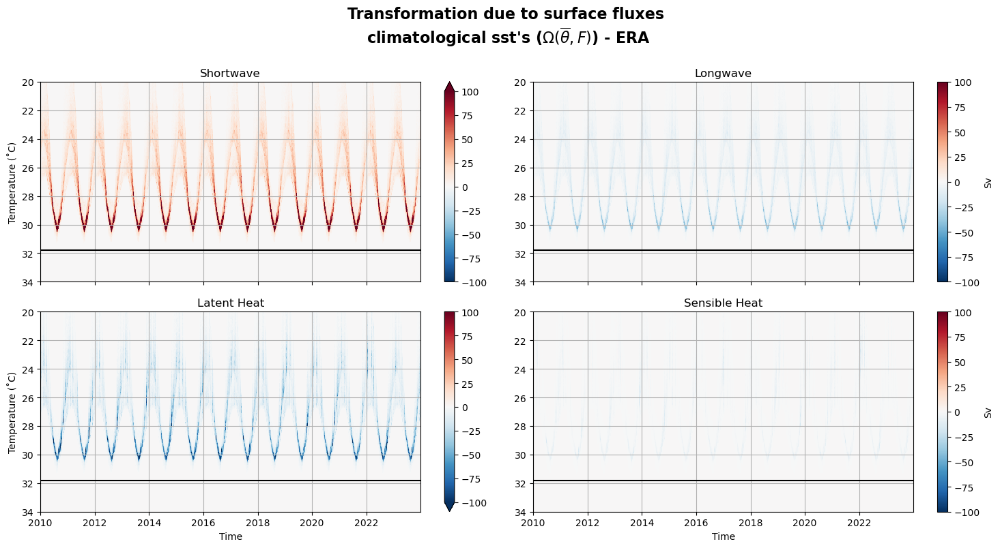

In [147]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_sst_dai_clim_e.omega_ssr/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-era.pdf', transparent=True);

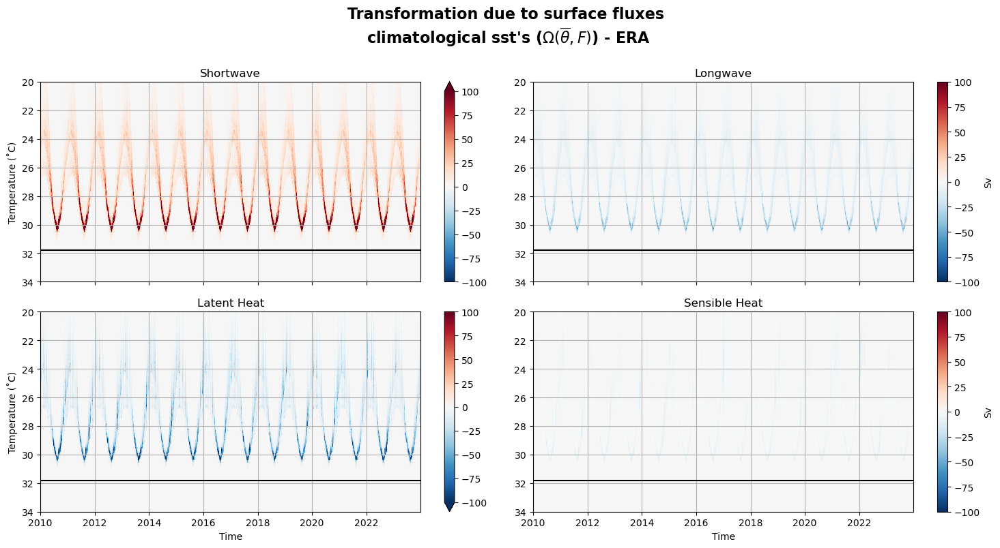

In [70]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_sst_dai_clim_g_ssrz/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-era.pdf', transparent=True);

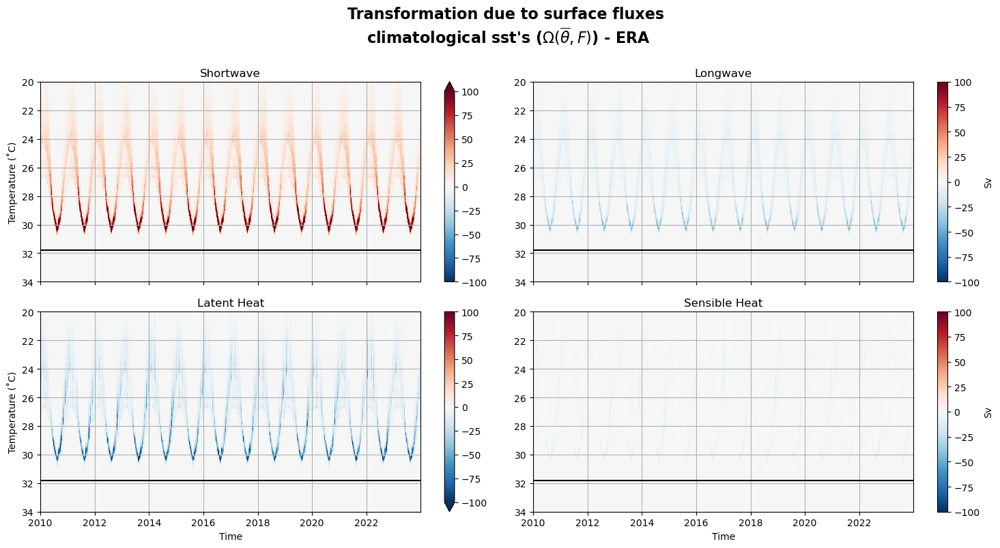

In [85]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_sst_dai_clim_e_ssrz/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-era.pdf', transparent=True);

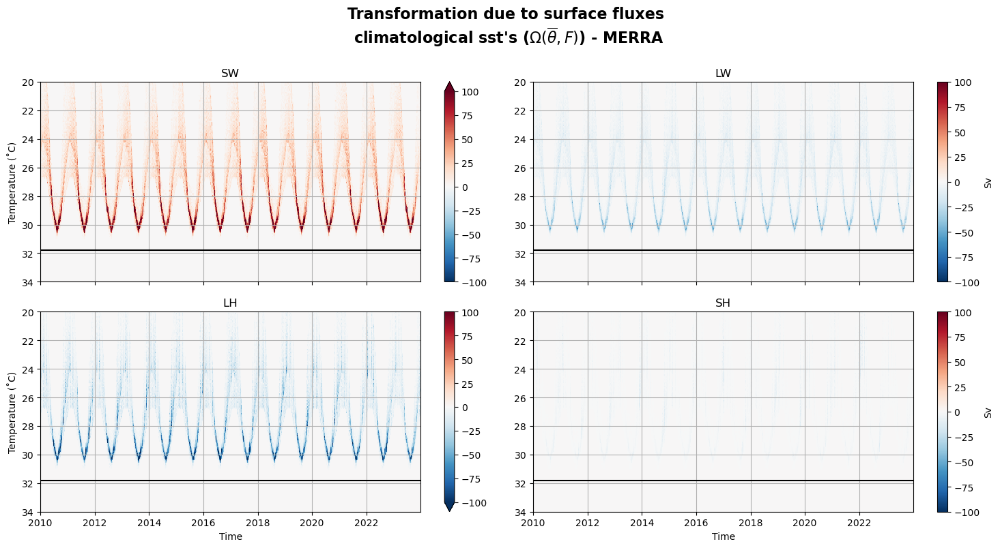

In [87]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_sst_dai_clim_m.omega_SWGNTWTR/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_LWGNTWTR/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_EFLUXWTR/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_HFLUXWTR/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-merra.pdf', transparent=True);

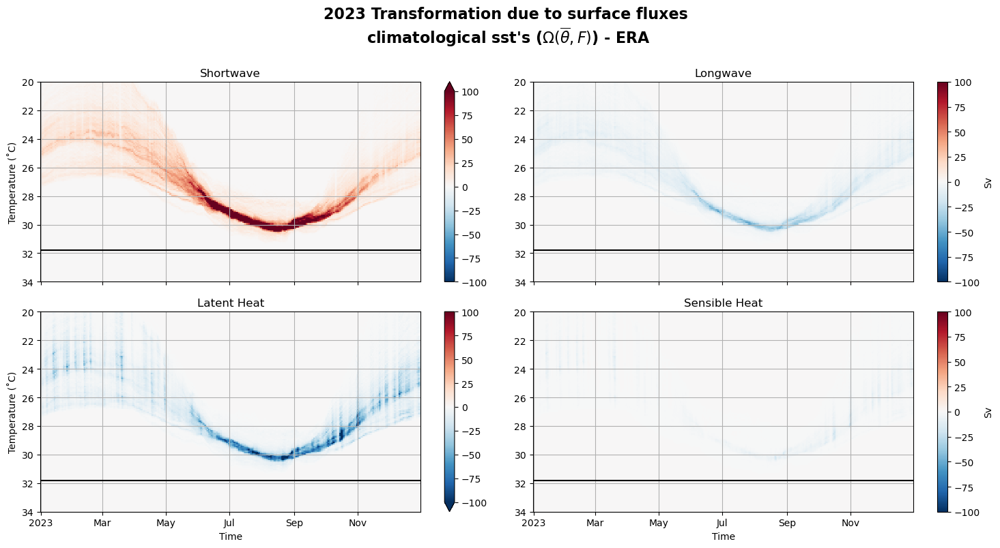

In [148]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))
(hist_sst_dai_clim_e.omega_ssr/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-2023-era.pdf', transparent=True);

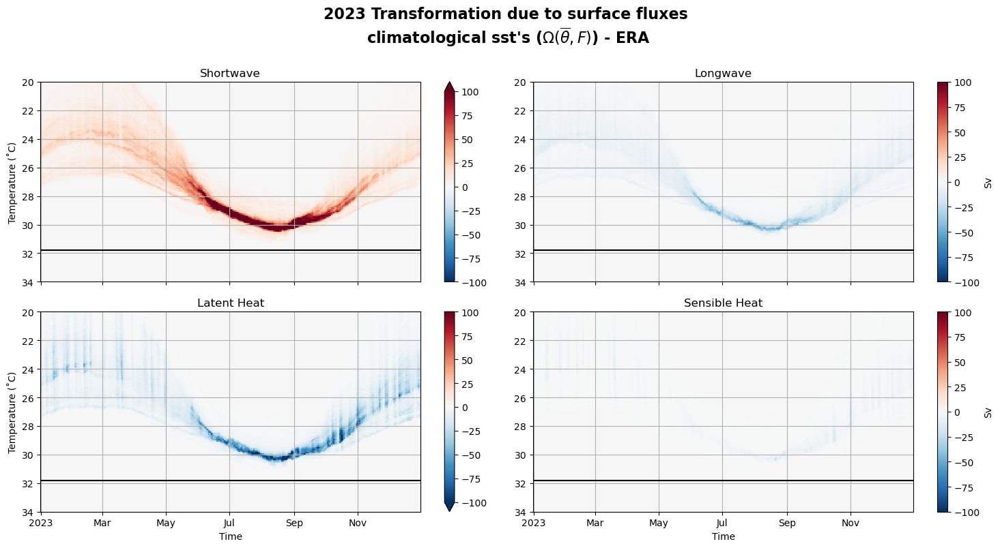

In [73]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))
(hist_sst_dai_clim_g_ssrz/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-2023-era.pdf', transparent=True);

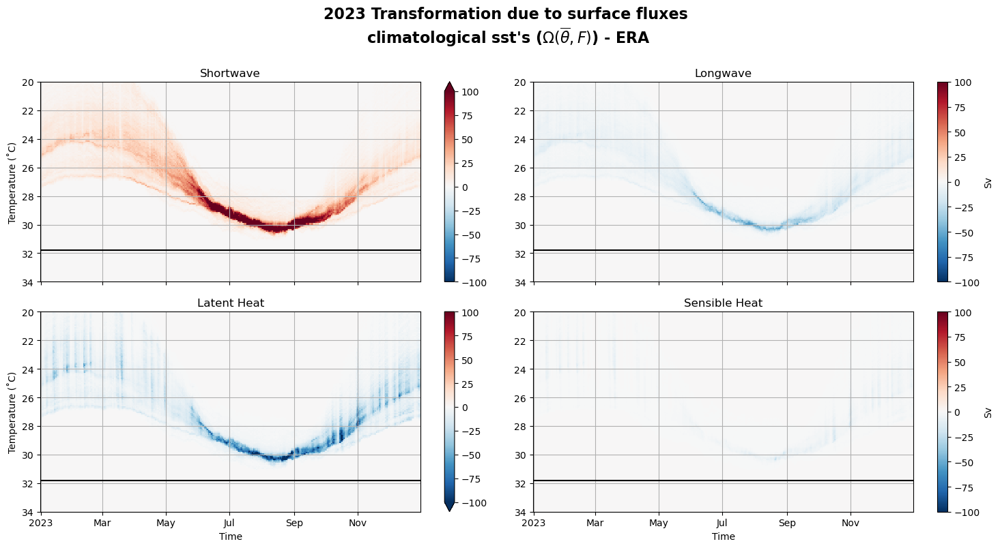

In [86]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))
(hist_sst_dai_clim_e_ssrz/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_e.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-2023-era.pdf', transparent=True);

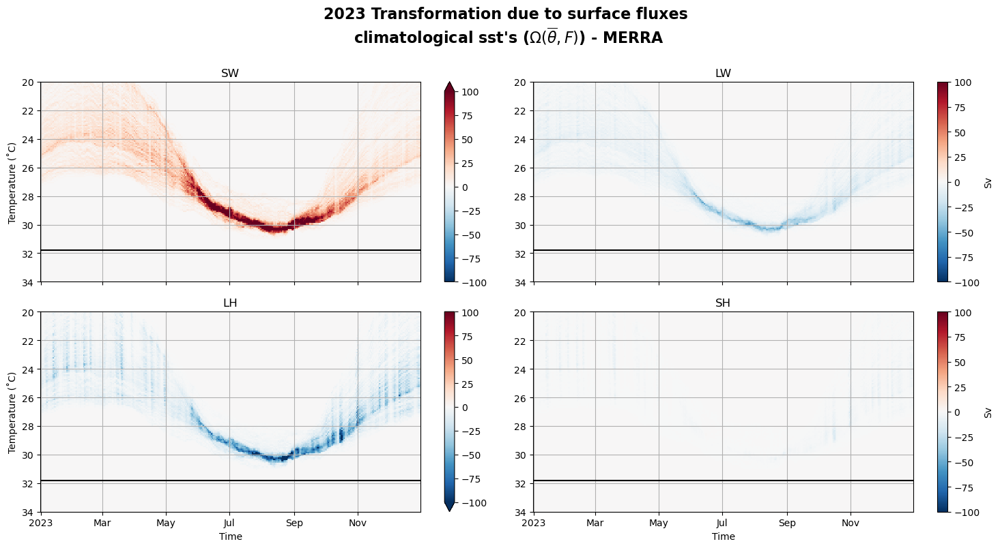

In [59]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(hist_sst_dai_clim_m.omega_SWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_LWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_EFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(hist_sst_dai_clim_m.omega_HFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological sst's ($\Omega(\overline{\theta}, F)$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-sst_clim-2023-merra.pdf', transparent=True);

## Insert daily climatological fluxes into hist function $\Omega(\theta, \overline{F})$
(with time varying sst)

In [150]:
dai_flx_e1 = era_weighted.where(~mask_e).groupby('time.dayofyear').mean('time')
dai_flx_e = dai_flx_e1.drop_vars('sst')
dai_ssrz = ssr_z.where(~mask_e).groupby('time.dayofyear').mean('time')
dai_dFlxdz = dFlxdz.where(~mask_e).groupby('time.dayofyear').mean('time')
#dai_flx_m1 = merra_weighted.where(~mask_m).groupby('time.dayofyear').mean('time')
#dai_flx_m = dai_flx_m1.drop_vars('TSKINWTR')

In [151]:
dai_dFlxdz

<xarray.DataArray (depth: 75, dayofyear: 366, latitude: 40, longitude: 80)> Size: 703MB
array([[[[           nan,            nan,            nan, ...,
          1.44691808e+04, 1.46018958e+04, 1.47212228e+04],
         [           nan,            nan,            nan, ...,
          1.46775882e+04, 1.47856685e+04, 1.48831197e+04],
         [           nan,            nan,            nan, ...,
          1.47890853e+04, 1.48451282e+04, 1.48132939e+04],
         ...,
         [           nan,            nan,            nan, ...,
          7.98554257e+03, 8.01075111e+03, 7.92914640e+03],
         [           nan,            nan,            nan, ...,
          7.82412203e+03, 7.83328111e+03, 7.74919764e+03],
         [           nan,            nan,            nan, ...,
          7.58491685e+03, 7.57463859e+03, 7.49088745e+03]],

        [[           nan,            nan,            nan, ...,
          1.45160739e+04, 1.46572784e+04, 1.47852905e+04],
         [           nan,            nan,            nan, ...,
          1.46191361e+04, 1.47358605e+04, 1.48529767e+04],
         [           nan,            nan,            nan, ...,
          1.46570336e+04, 1.47210993e+04, 1.47022201e+04],
...
         [           nan,            nan,            nan, ...,
          1.21987231e-87, 1.21317013e-87, 1.20246534e-87],
         [           nan,            nan,            nan, ...,
          1.19863022e-87, 1.19305970e-87, 1.18374035e-87],
         [           nan,            nan,            nan, ...,
          1.17824850e-87, 1.17985320e-87, 1.17726123e-87]],

        [[           nan,            nan,            nan, ...,
          1.55718996e-87, 1.64050524e-87, 1.72342915e-87],
         [           nan,            nan,            nan, ...,
          1.66219874e-87, 1.75853707e-87, 1.84128936e-87],
         [           nan,            nan,            nan, ...,
          1.78959940e-87, 1.87683202e-87, 1.92937617e-87],
         ...,
         [           nan,            nan,            nan, ...,
          1.24286045e-87, 1.21872808e-87, 1.19248219e-87],
         [           nan,            nan,            nan, ...,
          1.21659672e-87, 1.20415699e-87, 1.18785086e-87],
         [           nan,            nan,            nan, ...,
          1.19463150e-87, 1.18893749e-87, 1.17707592e-87]]]])
Coordinates:
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [152]:
dai_ssrz

<xarray.DataArray (depth: 76, dayofyear: 366, latitude: 40, longitude: 80)> Size: 712MB
array([[[[           nan,            nan,            nan, ...,
          3.05434125e+04, 3.08235645e+04, 3.10754553e+04],
         [           nan,            nan,            nan, ...,
          3.09833459e+04, 3.12114957e+04, 3.14172081e+04],
         [           nan,            nan,            nan, ...,
          3.12187081e+04, 3.13370108e+04, 3.12698108e+04],
         ...,
         [           nan,            nan,            nan, ...,
          1.68569130e+04, 1.69101264e+04, 1.67378646e+04],
         [           nan,            nan,            nan, ...,
          1.65161657e+04, 1.65354998e+04, 1.63580056e+04],
         [           nan,            nan,            nan, ...,
          1.60112205e+04, 1.59895238e+04, 1.58127311e+04]],

        [[           nan,            nan,            nan, ...,
          3.06424006e+04, 3.09404732e+04, 3.12106977e+04],
         [           nan,            nan,            nan, ...,
          3.08599575e+04, 3.11063545e+04, 3.13535785e+04],
         [           nan,            nan,            nan, ...,
          3.09399564e+04, 3.10751946e+04, 3.10353420e+04],
...
         [           nan,            nan,            nan, ...,
          1.70661506e-88, 1.69723863e-88, 1.68226252e-88],
         [           nan,            nan,            nan, ...,
          1.67689714e-88, 1.66910392e-88, 1.65606604e-88],
         [           nan,            nan,            nan, ...,
          1.64838288e-88, 1.65062787e-88, 1.64700168e-88]],

        [[           nan,            nan,            nan, ...,
          2.17852624e-88, 2.29508524e-88, 2.41109673e-88],
         [           nan,            nan,            nan, ...,
          2.32543470e-88, 2.46021311e-88, 2.57598449e-88],
         [           nan,            nan,            nan, ...,
          2.50366966e-88, 2.62570907e-88, 2.69921893e-88],
         ...,
         [           nan,            nan,            nan, ...,
          1.73877573e-88, 1.70501427e-88, 1.66829597e-88],
         [           nan,            nan,            nan, ...,
          1.70203247e-88, 1.68462915e-88, 1.66181670e-88],
         [           nan,            nan,            nan, ...,
          1.67130289e-88, 1.66333690e-88, 1.64674243e-88]]]])
Coordinates:
  * depth      (depth) float64 608B 0.0 0.5058 1.556 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [153]:
dai_flx_e

<xarray.Dataset> Size: 37MB
Dimensions:    (dayofyear: 366, latitude: 40, longitude: 80)
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
Data variables:
    slhf       (dayofyear, latitude, longitude) float64 9MB nan ... -3.704e+04
    sshf       (dayofyear, latitude, longitude) float64 9MB nan ... -7.196e+03
    ssr        (dayofyear, latitude, longitude) float64 9MB nan ... 1.801e+04
    str        (dayofyear, latitude, longitude) float64 9MB nan ... -1.529e+04

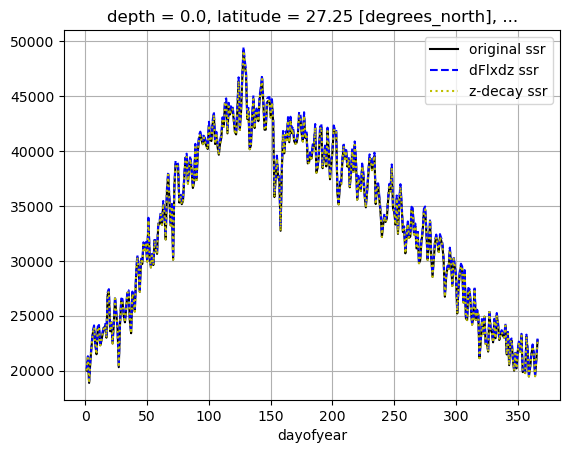

In [154]:
dai_flx_e.ssr[:, 25,70].plot(color='k', label='original ssr')
dai_dFlxdz.sum('depth')[:, 25,70].plot(color='b', label='dFlxdz ssr', linestyle='--')
dai_ssrz[0, :, 25,70].plot(color='y', label='z-decay ssr', linestyle='dotted')
plt.legend()
plt.grid()

In [96]:
sst_e.shape

(5113, 40, 80)

In [93]:
dai_flx_e.ssr.shape

(366, 40, 80)

In [97]:
sst_g.shape

(5113, 75, 40, 80)

In [101]:
dai_dFlxdz.shape

(75, 366, 40, 80)

**Leap Years in dataset: [2012, 2016, 2020]**

In [155]:
empty_flx_era = xr.Dataset(data_vars={'slhf':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'sshf':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'ssr':(['time','latitude', 'longitude'], np.empty((5113, 40, 80))),
                                      'str':(['time','latitude', 'longitude'], np.empty((5113, 40, 80)))}, 
                           coords={'time':sst_e.time.dt.dayofyear.values,
                                   'latitude':sst_e.latitude,
                                   'longitude':sst_e.longitude,},
                            attrs=dict(description='Climatological (daily) surface fluxes mapped onto original time dim.',
                                            units=r'W m$^{-2}$'))

In [102]:
empty_flx_dFlxdz = xr.Dataset(data_vars={'ssrz':(['time', 'depth', 'latitude', 'longitude'], np.empty((5113, 75, 40, 80)))}, 
                           coords={'time':sst_g.time.dt.dayofyear.values,
                                   'depth':dFlxdz.depth,
                                   'latitude':sst_g.latitude,
                                   'longitude':sst_g.longitude},
                            attrs=dict(description='Climatological (daily) ssr_z flux mapped onto original time dim.',
                                            units=r'W m$^{-2}$'))

In [156]:
for i in np.arange(1,367):
    for j in list(dai_flx_e.data_vars):
        empty_flx_era[j][np.where(empty_flx_era.time.values==i)] = dai_flx_e[j][i-1,:,:]

In [104]:
for i in np.arange(1,367):
    empty_flx_dFlxdz['ssrz'][np.where(empty_flx_dFlxdz.time.values==i)] = dai_dFlxdz[:,i-1,:,:]

In [105]:
empty_flx_era.ssr

<xarray.DataArray 'ssr' (time: 5113, latitude: 40, longitude: 80)> Size: 131MB
array([[[           nan,            nan,            nan, ...,
         30543.4124845 , 30823.56453711, 31075.45529091],
        [           nan,            nan,            nan, ...,
         30983.34587109, 31211.49567073, 31417.20811206],
        [           nan,            nan,            nan, ...,
         31218.70814056, 31337.01082785, 31269.8107682 ],
        ...,
        [           nan,            nan,            nan, ...,
         16856.91295673, 16910.12639032, 16737.86464112],
        [           nan,            nan,            nan, ...,
         16516.16566381, 16535.49982495, 16358.00560563],
        [           nan,            nan,            nan, ...,
         16011.22051699, 15989.5238495 , 15812.73114934]],

       [[           nan,            nan,            nan, ...,
         30642.4006102 , 30940.47323045, 31210.69766273],
        [           nan,            nan,            nan, ...,
         30859.9575033 , 31106.35450379, 31353.57846806],
        [           nan,            nan,            nan, ...,
         30939.95643073, 31075.19463049, 31035.34197544],
...
        [           nan,            nan,            nan, ...,
         19067.53649144, 18839.34930281, 18620.94314014],
        [           nan,            nan,            nan, ...,
         18926.48267275, 18742.61037758, 18564.80427301],
        [           nan,            nan,            nan, ...,
         18771.34482877, 18648.93905879, 18500.80954601]],

       [[           nan,            nan,            nan, ...,
         30494.5421965 , 30429.96013098, 30341.9980428 ],
        [           nan,            nan,            nan, ...,
         30994.47363873, 30925.48605294, 30797.50771856],
        [           nan,            nan,            nan, ...,
         31286.03270307, 31150.49988619, 30802.82757082],
        ...,
        [           nan,            nan,            nan, ...,
         18661.71616652, 18559.18557228, 18395.42278484],
        [           nan,            nan,            nan, ...,
         18336.75279271, 18251.53443223, 18108.96615736],
        [           nan,            nan,            nan, ...,
         18024.95129442, 18049.50015864, 18009.84805956]]])
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) int64 41kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365

In [106]:
empty_flx_dFlxdz.ssrz

<xarray.DataArray 'ssrz' (time: 5113, depth: 75, latitude: 40, longitude: 80)> Size: 10GB
array([[[[           nan,            nan,            nan, ...,
          1.44691808e+04, 1.46018958e+04, 1.47212228e+04],
         [           nan,            nan,            nan, ...,
          1.46775882e+04, 1.47856685e+04, 1.48831197e+04],
         [           nan,            nan,            nan, ...,
          1.47890853e+04, 1.48451282e+04, 1.48132939e+04],
         ...,
         [           nan,            nan,            nan, ...,
          7.98554257e+03, 8.01075111e+03, 7.92914640e+03],
         [           nan,            nan,            nan, ...,
          7.82412203e+03, 7.83328111e+03, 7.74919764e+03],
         [           nan,            nan,            nan, ...,
          7.58491685e+03, 7.57463859e+03, 7.49088745e+03]],

        [[           nan,            nan,            nan, ...,
          7.90398166e+03, 7.97647902e+03, 8.04166296e+03],
         [           nan,            nan,            nan, ...,
          8.01782701e+03, 8.07686730e+03, 8.13010128e+03],
         [           nan,            nan,            nan, ...,
          8.07873373e+03, 8.10934793e+03, 8.09195800e+03],
...
         [           nan,            nan,            nan, ...,
          1.75211287e-84, 1.74248647e-84, 1.72711110e-84],
         [           nan,            nan,            nan, ...,
          1.72160268e-84, 1.71360169e-84, 1.70021623e-84],
         [           nan,            nan,            nan, ...,
          1.69232824e-84, 1.69463308e-84, 1.69091022e-84]],

        [[           nan,            nan,            nan, ...,
          1.99335620e-87, 1.98913463e-87, 1.98338475e-87],
         [           nan,            nan,            nan, ...,
          2.02603554e-87, 2.02152599e-87, 2.01316034e-87],
         [           nan,            nan,            nan, ...,
          2.04509407e-87, 2.03623461e-87, 2.01350809e-87],
         ...,
         [           nan,            nan,            nan, ...,
          1.21987231e-87, 1.21317013e-87, 1.20246534e-87],
         [           nan,            nan,            nan, ...,
          1.19863022e-87, 1.19305970e-87, 1.18374035e-87],
         [           nan,            nan,            nan, ...,
          1.17824850e-87, 1.17985320e-87, 1.17726123e-87]]]])
Coordinates:
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) int64 41kB 1 2 3 4 5 6 7 8 ... 359 360 361 362 363 364 365

In [107]:
flx_e_repeating = empty_flx_era.assign_coords({'time':sst_e.time})
#flx_ssrz_repeating = empty_flx_ssrz.assign_coords({'time':sst_e.time})
flx_dFlxdz_repeating = empty_flx_dFlxdz.assign_coords({'time':sst_g.time})
#flx_m_repeating = empty_flx_merra.assign_coords({'time':sst_m.time})

In [108]:
sst_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [109]:
flx_e_repeating.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [111]:
sst_g.coords

Coordinates:
  * depth      (depth) float32 300B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [110]:
flx_dFlxdz_repeating.coords

Coordinates:
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

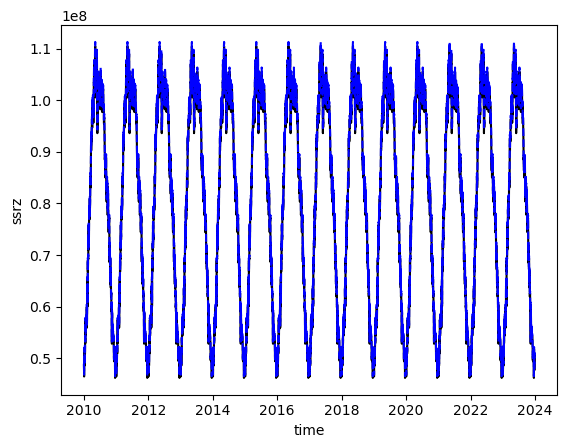

In [112]:
flx_e_repeating.ssr.sum(['latitude', 'longitude']).plot(color='k')
#flx_ssrz_repeating.ssrz.isel(depth=0).sum(['latitude', 'longitude']).plot(color='y', linestyle='dotted')
flx_dFlxdz_repeating.ssrz.sum(['latitude', 'longitude', 'depth']).plot(color='blue', linestyle='--')

In [157]:
sst_e

<xarray.DataArray 'sst' (time: 5113, latitude: 40, longitude: 80)> Size: 131MB
array([[[        nan,         nan,         nan, ..., 27.73057843,
         27.67079092, 27.57129928],
        [        nan,         nan,         nan, ..., 27.64744196,
         27.59764171, 27.48457066],
        [        nan,         nan,         nan, ..., 27.45811938,
         27.51632852, 27.55562445],
        ...,
        [        nan,         nan,         nan, ..., 21.31706862,
         22.6454834 , 23.97033324],
        [        nan,         nan,         nan, ..., 20.7131794 ,
         21.91442666, 23.28069507],
        [        nan,         nan,         nan, ..., 20.08370972,
         21.06140014, 22.32284311]],

       [[        nan,         nan,         nan, ..., 27.50204156,
         27.42973596, 27.31157603],
        [        nan,         nan,         nan, ..., 27.42010247,
         27.34855884, 27.21796245],
        [        nan,         nan,         nan, ..., 27.23475303,
         27.26610269, 27.28928838],
...
        [        nan,         nan,         nan, ..., 20.10007191,
         21.98020098, 24.20327311],
        [        nan,         nan,         nan, ..., 19.53965629,
         21.51924086, 23.37925437],
        [        nan,         nan,         nan, ..., 18.2920308 ,
         20.65737954, 23.1489182 ]],

       [[        nan,         nan,         nan, ..., 27.36115785,
         27.41275615, 27.39206503],
        [        nan,         nan,         nan, ..., 27.2674291 ,
         27.29683984, 27.25134241],
        [        nan,         nan,         nan, ..., 27.1962908 ,
         27.28587557, 27.36164707],
        ...,
        [        nan,         nan,         nan, ..., 20.0899134 ,
         22.00342453, 24.08729925],
        [        nan,         nan,         nan, ..., 19.48322335,
         21.44013115, 23.26871949],
        [        nan,         nan,         nan, ..., 18.21706507,
         20.55018286, 22.90764653]]])
Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31

In [159]:
sst_g.isel(depth=0)

<xarray.DataArray 'thetao_glor' (time: 5113, latitude: 40, longitude: 80)> Size: 65MB
dask.array<getitem, shape=(5113, 40, 80), dtype=float32, chunksize=(640, 6, 29), chunktype=numpy.ndarray>
Coordinates:
    depth      float32 4B 0.5058
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Attributes:
    cell_methods:   area: mean
    long_name:      Temperature
    standard_name:  sea_water_potential_temperature
    unit_long:      Degrees Celsius
    units:          degrees_C
    valid_max:      42.0
    valid_min:      -20.0

In [160]:
era_hist_flx_clim = xr.merge([hist_func(sst_g.isel(depth=0), 
                               flx_e_repeating,
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(flx_e_repeating)])

In [115]:
hist_flx_clim_dFlxdz = hist_func_ssrz(sst_g.assign_coords({'depth':flx_dFlxdz_repeating.depth}),
                                      flx_dFlxdz_repeating.ssrz,
                                      'latitude', 'longitude', 'depth').rename('omega_ssrz')

In [161]:
era_hist_flx_clim

<xarray.Dataset> Size: 29MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB dask.array<chunksize=(640, 179), meta=np.ndarray>
    omega_sshf  (time, theta_bin) float64 7MB dask.array<chunksize=(640, 179), meta=np.ndarray>
    omega_ssr   (time, theta_bin) float64 7MB dask.array<chunksize=(640, 179), meta=np.ndarray>
    omega_str   (time, theta_bin) float64 7MB dask.array<chunksize=(640, 179), meta=np.ndarray>

In [117]:
hist_flx_clim_dFlxdz

<xarray.DataArray 'omega_ssrz' (time: 5113, theta_bin: 179)> Size: 7MB
dask.array<truediv, shape=(5113, 179), dtype=float64, chunksize=(74, 179), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin  (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85

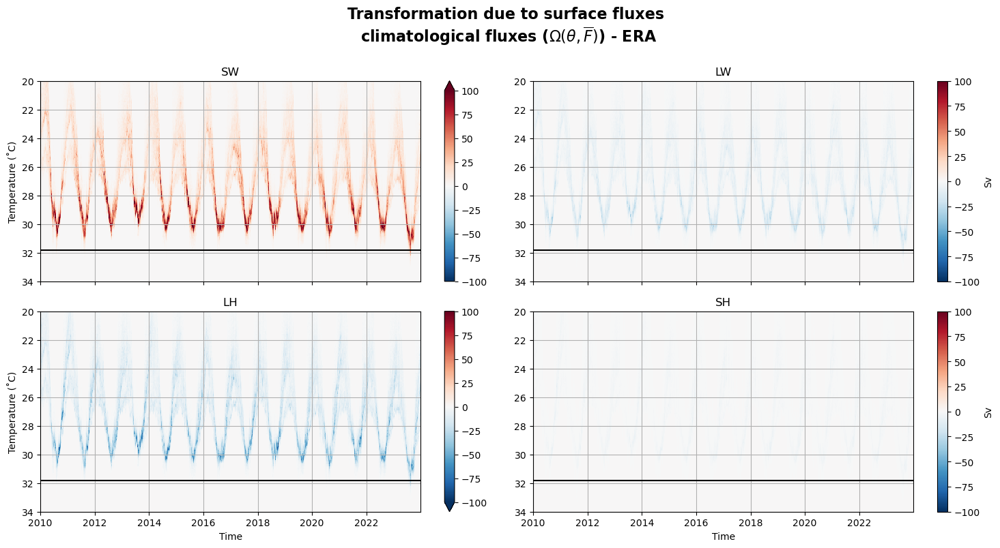

In [162]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_flx_clim_dFlxdz/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-flxs_clim-era.pdf', transparent=True);

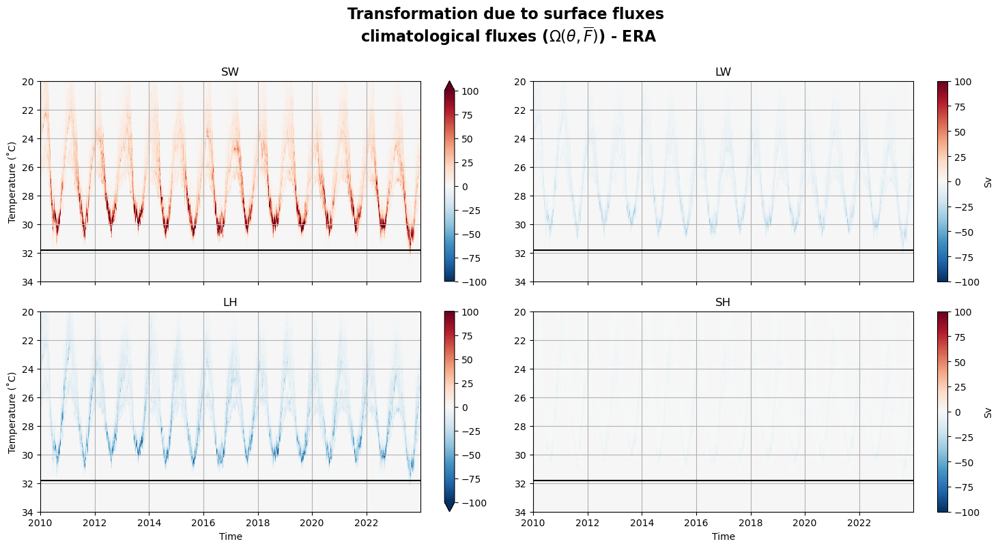

In [69]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(hist_flx_clim_dFlxdz/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-flxs_clim-era.pdf', transparent=True);

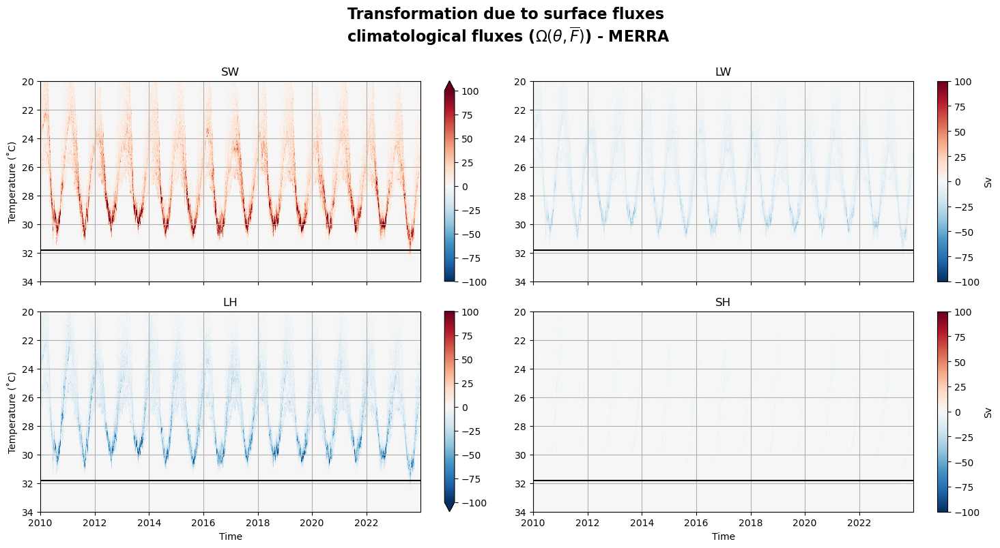

In [61]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist_flx_clim.omega_SWGNTWTR/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_LWGNTWTR/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_EFLUXWTR/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_HFLUXWTR/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-merra.pdf', transparent=True);

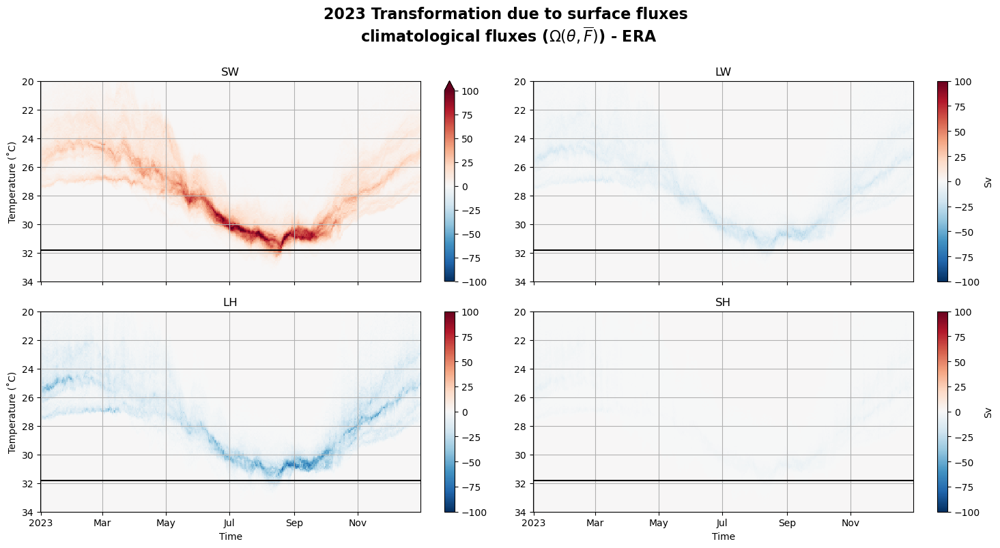

In [119]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(hist_flx_clim_dFlxdz/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-flxs_clim-2023-era.pdf', transparent=True);

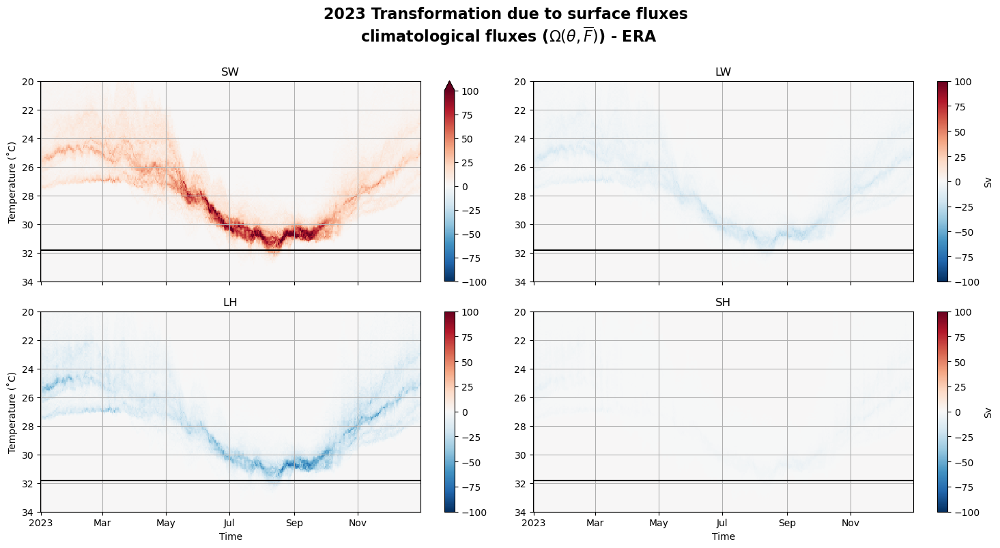

In [71]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(hist_flx_clim_dFlxdz/1e6).sel(**year).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_str/1e6).sel(**year).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_flx_clim.omega_slhf/1e6).sel(**year).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_flx_clim.omega_sshf/1e6).sel(**year).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/transformation-flxs_clim-2023-era.pdf', transparent=True);

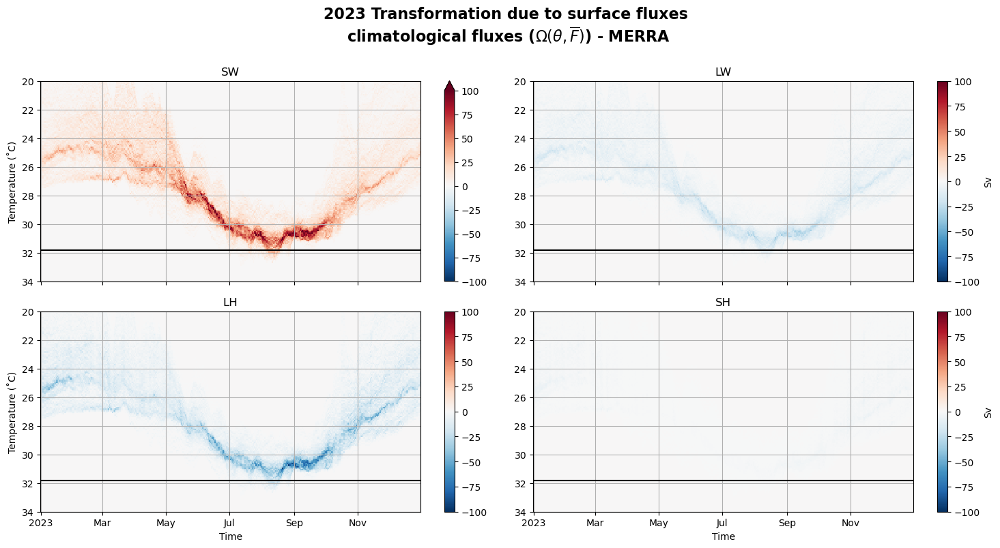

In [63]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
year = dict(time=slice('2023', '2023'))

(merra_hist_flx_clim.omega_SWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_LWGNTWTR/1e6).sel(**year).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_EFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,0], vmax=100, vmin=-100,  rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist_flx_clim.omega_HFLUXWTR/1e6).sel(**year).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("2023 Transformation due to surface fluxes \n" r"climatological fluxes ($\Omega(\theta, \overline{F})$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-flxs_clim-2023-merra.pdf', transparent=True);

## Daily climatology $\overline{\Omega(\theta, F)}$

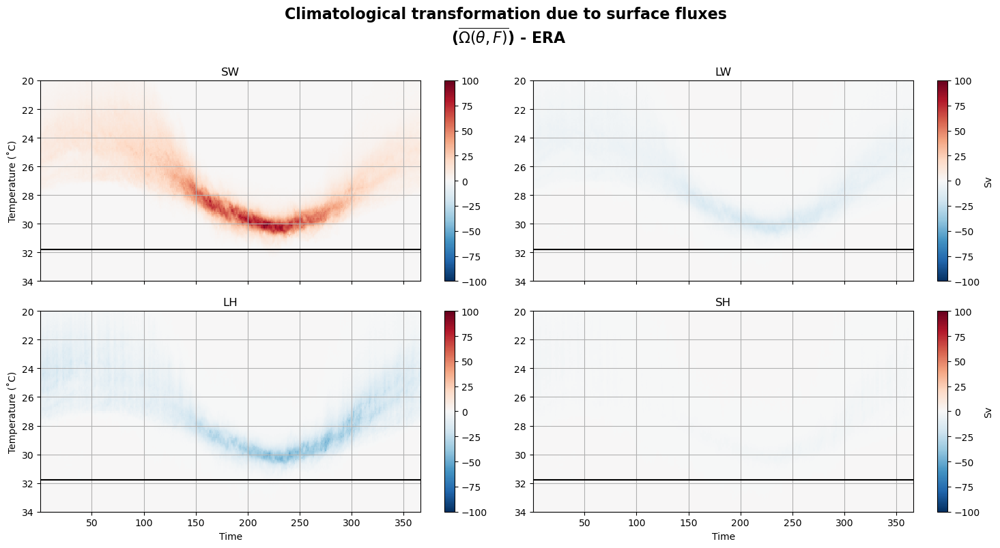

In [64]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(era_hist.omega_ssr.groupby('time.dayofyear').mean('time')/1e6).T.plot(label='SW', ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist.omega_str.groupby('time.dayofyear').mean('time')/1e6).T.plot(label='LW', ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist.omega_slhf.groupby('time.dayofyear').mean('time')/1e6).T.plot(label='LH', ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist.omega_sshf.groupby('time.dayofyear').mean('time')/1e6).T.plot(label='SH', ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Climatological transformation due to surface fluxes \n" r"($\overline{\Omega(\theta, F)}$) - ERA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-clim-era.pdf', transparent=True);

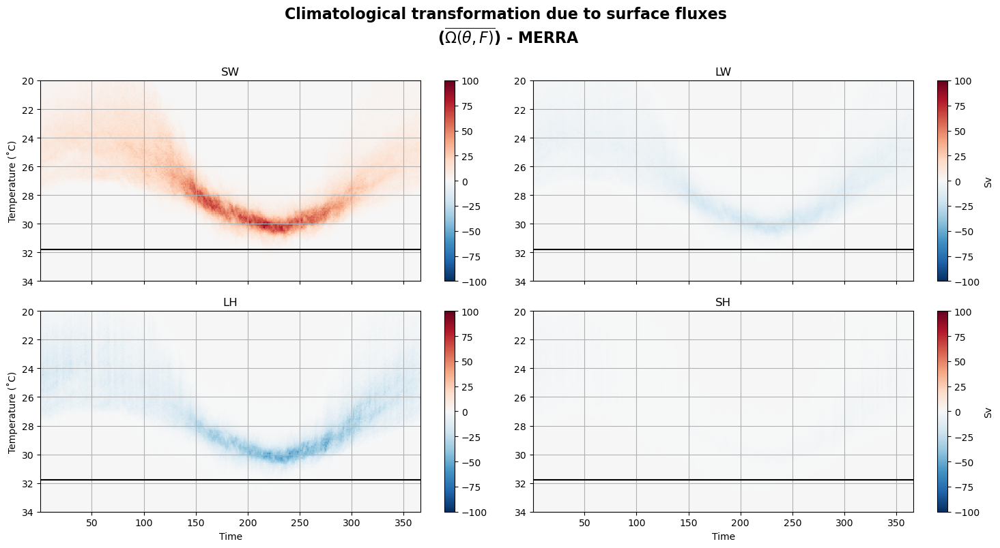

In [65]:
dayofyearfig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
(merra_hist.omega_SWGNTWTR.groupby('time.dayofyear').mean('time')/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True, 
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(merra_hist.omega_LWGNTWTR.groupby('time.dayofyear').mean('time')/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(merra_hist.omega_EFLUXWTR.groupby('time.dayofyear').mean('time')/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,  
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(merra_hist.omega_HFLUXWTR.groupby('time.dayofyear').mean('time')/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle("Climatological transformation due to surface fluxes \n" r"($\overline{\Omega(\theta, F)}$) - MERRA", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/transformation-clim-merra.pdf', transparent=True);

## Insert daily climatological temperatures and fluxes $\Omega(\overline{\theta}, \overline{F})$

In [74]:
dai_sst_e = sst_e.groupby('time.dayofyear').mean('time')
dai_sst_g = sst_g.groupby('time.dayofyear').mean('time')
#dai_sst_m = sst_m.groupby('time.dayofyear').mean('time')

In [75]:
dai_flx_e1 = era_weighted.where(~mask_e).groupby('time.dayofyear').mean('time')
#dai_flx_m1 = merra_weighted.where(~mask_m).groupby('time.dayofyear').mean('time')
dai_flx_e = dai_flx_e1.drop_vars('sst')
#dai_flx_m = dai_flx_m1.drop_vars('TSKINWTR')
dai_dFlxdz = dFlxdz.where(~mask_e).groupby('time.dayofyear').mean('time')

In [76]:
dai_sst_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [78]:
dai_flx_e.coords

Coordinates:
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [77]:
dai_sst_g.coords

Coordinates:
  * depth      (depth) float32 300B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [79]:
dai_dFlxdz.coords

Coordinates:
  * depth      (depth) float64 600B 0.5058 1.556 2.668 ... 5.698e+03 5.902e+03
  * latitude   (latitude) float32 160B 21.0 21.25 21.5 ... 30.25 30.5 30.75
  * longitude  (longitude) float32 320B -100.0 -99.75 -99.5 ... -80.5 -80.25
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [80]:
era_hist_dai_clim = xr.merge([hist_func(dai_sst_e, dai_flx_e,
                              'latitude', 'longitude', var).rename('omega_'+var) 
                                 for var in list(dai_flx_e)])
#merra_hist_dai_clim = xr.merge([hist_func(dai_sst_m, dai_flx_e,
#                                'lat', 'lon', var).rename('omega_'+var)
#                                  for var in list(dai_flx_e)])

In [82]:
hist_dai_clim_dFlxdz = hist_func_ssrz(dai_sst_g, dai_dFlxdz.assign_coords({'depth':dai_sst_g.depth}),
                                      'latitude', 'longitude', 'depth').rename('omega_ssrz')

In [83]:
era_hist_dai_clim

<xarray.Dataset> Size: 2MB
Dimensions:     (dayofyear: 366, theta_bin: 179)
Coordinates:
  * dayofyear   (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (dayofyear, theta_bin) float64 524kB -1.01e+06 ... 0.0
    omega_sshf  (dayofyear, theta_bin) float64 524kB -3.307e+05 ... 0.0
    omega_ssr   (dayofyear, theta_bin) float64 524kB 6.185e+05 1.05e+06 ... 0.0
    omega_str   (dayofyear, theta_bin) float64 524kB -3.695e+05 ... 0.0

In [84]:
hist_dai_clim_dFlxdz

<xarray.DataArray 'omega_ssrz' (dayofyear: 366, theta_bin: 179)> Size: 524kB
dask.array<truediv, shape=(366, 179), dtype=float64, chunksize=(74, 179), chunktype=numpy.ndarray>
Coordinates:
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
  * theta_bin  (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85

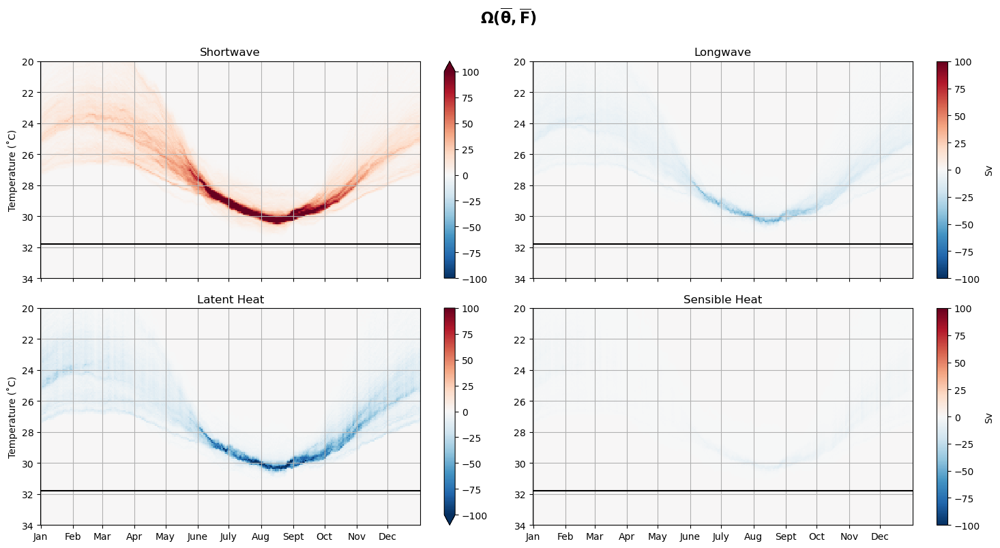

In [85]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)

T = [dai_sst_e.dayofyear[i].values for i in [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334,]]

(hist_dai_clim_dFlxdz/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_str/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_dai_clim.omega_slhf/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xticks(T)
ax[1,0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,0].set_xlabel('')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_sshf/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xticks(T)
ax[1,1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,1].set_xlabel('')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle(r"$\mathbf{\Omega(\overline{\theta}, \overline{F})}$", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/era/pcolor-sst_flx_clim.pdf', transparent=True);

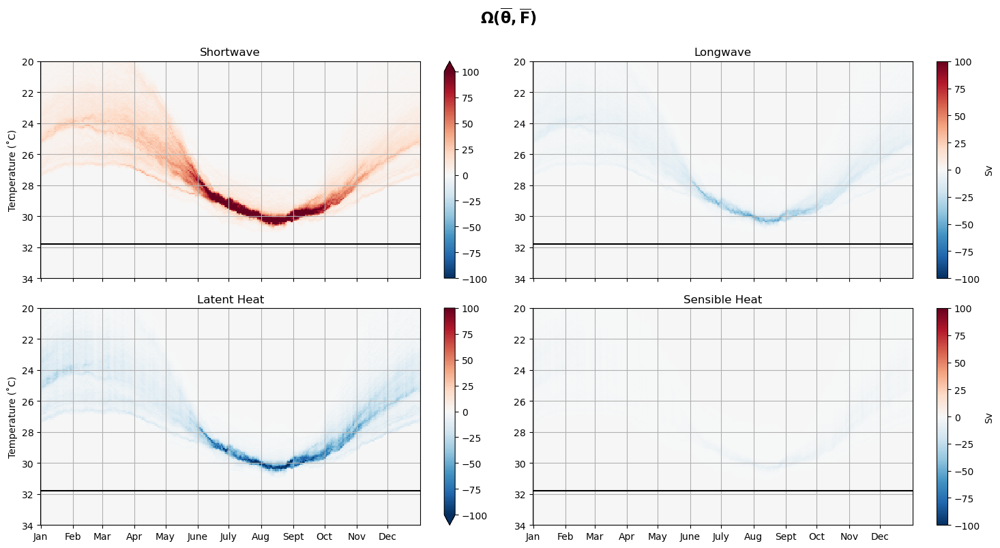

In [96]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)

T = [dai_sst_e.dayofyear[i].values for i in [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334,]]

(hist_dai_clim_dFlxdz/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_str/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_dai_clim.omega_slhf/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xticks(T)
ax[1,0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,0].set_xlabel('')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_sshf/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xticks(T)
ax[1,1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,1].set_xlabel('')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle(r"$\mathbf{\Omega(\overline{\theta}, \overline{F})}$", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
#plt.savefig('paper-figs/era/pcolor-sst_flx_clim.pdf', transparent=True);

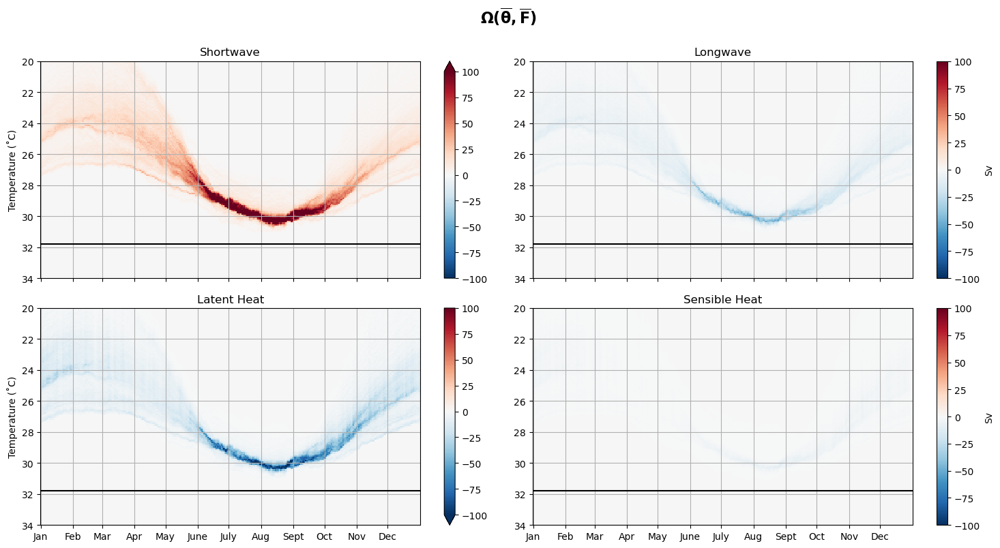

In [39]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)

T = [dai_sst_e.dayofyear[i].values for i in [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334,]]

(era_hist_dai_clim.omega_ssr/1e6).T.plot(ax=ax[0,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':''})
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('Shortwave')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_str/1e6).T.plot(ax=ax[0,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r',cbar_kwargs={'label':'Sv'})
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('Longwave')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
(era_hist_dai_clim.omega_slhf/1e6).T.plot(ax=ax[1,0], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':''})
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('Latent Heat')
ax[1,0].set_xticks(T)
ax[1,0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,0].set_xlabel('')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
(era_hist_dai_clim.omega_sshf/1e6).T.plot(ax=ax[1,1], vmax=100, vmin=-100, rasterized=True,
                                       cmap='RdBu_r', cbar_kwargs={'label':'Sv'})
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('Sensible Heat')
ax[1,1].set_xticks(T)
ax[1,1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 
                    'July', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'])
ax[1,1].set_xlabel('')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle(r"$\mathbf{\Omega(\overline{\theta}, \overline{F})}$", 
             y=1, fontsize=16, weight='bold')
plt.tight_layout()
plt.savefig('paper-figs/era/pcolor-sst_flx_clim.pdf', transparent=True);

### Temp at which max transformation occurs

In [43]:
max_trans_era = era_hist.idxmax(dim='theta_bin')
max_trans_merra = merra_hist.idxmax(dim='theta_bin')

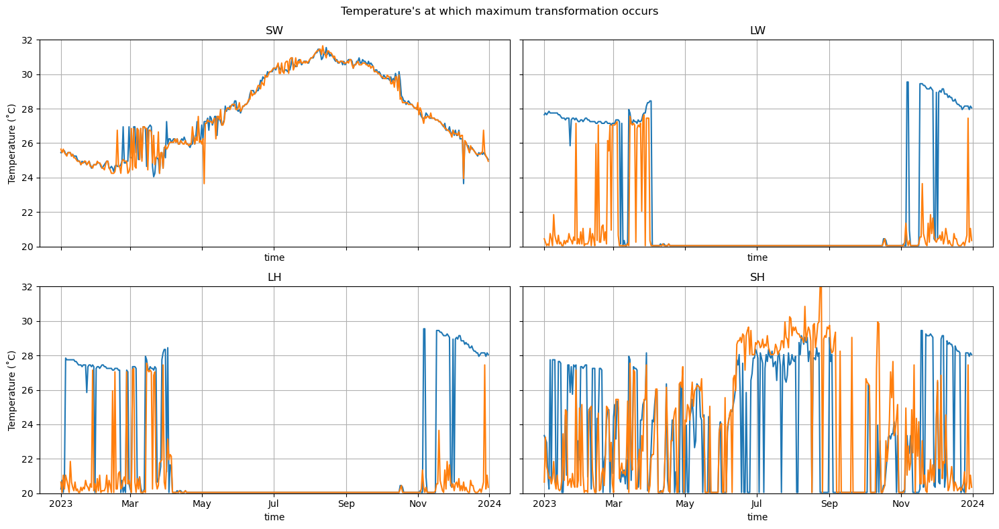

In [44]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharey=True, sharex=True)
year = dict(time=slice('2023', '2023'))

max_trans_era.omega_ssr.sel(**year).plot(ax=ax[0,0], label='ERA')
max_trans_merra.omega_SWGNTWTR.sel(**year).plot(ax=ax[0,0], label='MERRA')
ax[0,0].set_title('SW')
ax[0,0].grid()
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].set_ylim(20, 32)

max_trans_era.omega_str.sel(**year).plot(ax=ax[0,1], label='ERA')
max_trans_merra.omega_LWGNTWTR.sel(**year).plot(ax=ax[0,1], label='MERRA')
ax[0,1].set_title('LW')
ax[0,1].grid()
ax[0,1].set_ylabel('')

max_trans_era.omega_slhf.sel(**year).plot(ax=ax[1,0], label='ERA')
max_trans_merra.omega_EFLUXWTR.sel(**year).plot(ax=ax[1,0], label='MERRA')
ax[1,0].set_title('LH')
ax[1,0].grid()
ax[1,0].set_ylabel('Temperature (˚C)')

max_trans_era.omega_sshf.sel(**year).plot(ax=ax[1,1], label='ERA')
max_trans_merra.omega_HFLUXWTR.sel(**year).plot(ax=ax[1,1], label='MERRA')
ax[1,1].set_title('SH')
ax[1,1].grid()
ax[1,1].set_ylabel('')

plt.suptitle("Temperature's at which maximum transformation occurs")
plt.tight_layout();

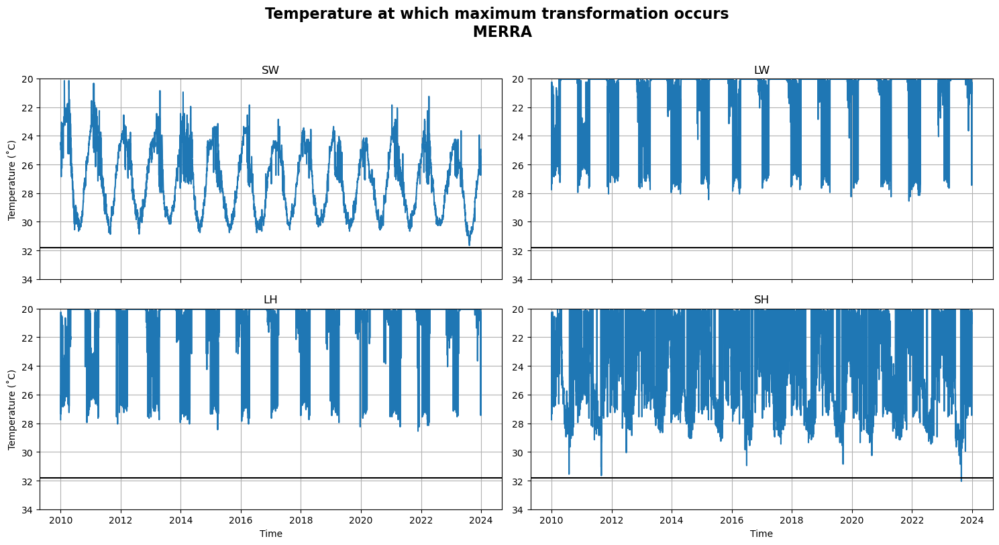

In [45]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
max_trans_merra.omega_SWGNTWTR.plot(ax=ax[0,0])
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
max_trans_merra.omega_LWGNTWTR.plot(ax=ax[0,1])
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
max_trans_merra.omega_EFLUXWTR.plot(ax=ax[1,0])
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
max_trans_merra.omega_HFLUXWTR.plot(ax=ax[1,1])
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('Temperature at which maximum transformation occurs \n MERRA', y=1.01, fontsize=16, weight='bold')
plt.tight_layout();

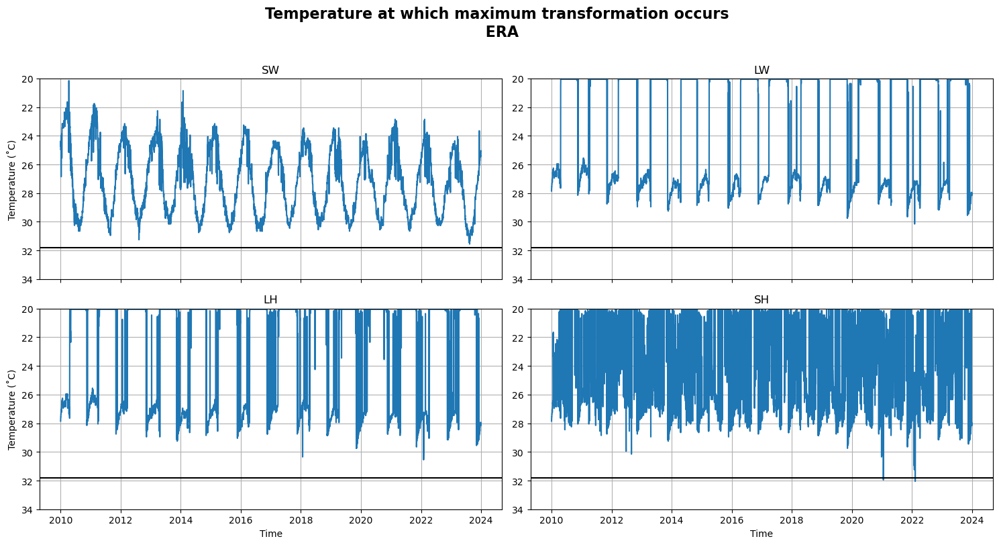

In [46]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True)
max_trans_era.omega_ssr.plot(ax=ax[0,0])
ax[0,0].set_ylim(34,20)
ax[0,0].grid()
ax[0,0].set_title('SW')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('Temperature (˚C)')
ax[0,0].axhline(31.8, color='k')
max_trans_era.omega_str.plot(ax=ax[0,1])
ax[0,1].set_ylim(34,20)
ax[0,1].grid()
ax[0,1].set_title('LW')
ax[0,1].set_xlabel('')
ax[0,1].set_ylabel('')
ax[0,1].axhline(31.8, color='k')
max_trans_era.omega_slhf.plot(ax=ax[1,0])
ax[1,0].set_ylim(34,20)
ax[1,0].grid()
ax[1,0].set_title('LH')
ax[1,0].set_xlabel('Time')
ax[1,0].set_ylabel('Temperature (˚C)')
ax[1,0].axhline(31.8, color='k')
max_trans_era.omega_sshf.plot(ax=ax[1,1])
ax[1,1].set_ylim(34,20)
ax[1,1].grid()
ax[1,1].set_title('SH')
ax[1,1].set_xlabel('Time')
ax[1,1].set_ylabel('')
ax[1,1].axhline(31.8, color='k')

plt.suptitle('Temperature at which maximum transformation occurs \n ERA', y=1.01, fontsize=16, weight='bold')
plt.tight_layout();

In [88]:
mt_slhf = max_trans_era.omega_slhf.values
mt_sshf = max_trans_era.omega_sshf.values
mt_ssr = max_trans_era.omega_ssr.values
mt_str = max_trans_era.omega_str.values

mt_EFLUXWTR = max_trans_merra.omega_EFLUXWTR.values
mt_HFLUXWTR = max_trans_merra.omega_HFLUXWTR.values
mt_SWGNTWTR = max_trans_merra.omega_SWGNTWTR.values
mt_LWGNTWTR = max_trans_merra.omega_LWGNTWTR.values

In [87]:
merra_weighted

<xarray.Dataset> Size: 131MB
Dimensions:   (lat: 20, lon: 32, time: 5113)
Coordinates:
  * lat       (lat) float64 160B 21.0 21.5 22.0 22.5 ... 29.0 29.5 30.0 30.5
  * lon       (lon) float64 256B -100.0 -99.38 -98.75 ... -81.88 -81.25 -80.62
  * time      (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    EFLUXWTR  (time, lat, lon) float64 26MB nan nan ... -9.481e+04 -1.925e+05
    HFLUXWTR  (time, lat, lon) float64 26MB nan nan ... -2.346e+04 -5.688e+04
    LWGNTWTR  (time, lat, lon) float64 26MB nan nan ... -1.045e+05 -1.214e+05
    SWGNTWTR  (time, lat, lon) float64 26MB nan nan nan ... 1.25e+05 1.249e+05
    TSKINWTR  (time, lat, lon) float64 26MB nan nan nan ... 1.253e+04 1.644e+04

In [89]:
mt_era = xr.Dataset(data_vars=dict(mt_slhf=('time', mt_slhf), mt_sshf=('time', mt_sshf),
                                  mt_ssr=('time', mt_ssr), mt_str=('time', mt_str)),
                    coords={'time':era_weighted.time})

mt_merra = xr.Dataset(data_vars=dict(mt_EFLUXWTR=('time', mt_EFLUXWTR), mt_HFLUXWTR=('time', mt_HFLUXWTR),
                                  mt_LWGNTWTR=('time', mt_LWGNTWTR), mt_SWGNTWTR=('time', mt_SWGNTWTR)),
                    coords={'time':merra_weighted.time})

In [73]:
mt_era

<xarray.Dataset> Size: 205kB
Dimensions:  (time: 5113)
Coordinates:
  * time     (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    mt_slhf  (time) float64 41kB 27.85 27.65 27.55 27.55 ... 27.95 28.15 28.05
    mt_sshf  (time) float64 41kB 27.85 27.65 27.55 27.55 ... 27.95 28.15 28.05
    mt_ssr   (time) float64 41kB 24.95 24.75 24.35 24.75 ... 25.25 25.15 25.05
    mt_str   (time) float64 41kB 27.85 27.65 27.55 27.55 ... 27.95 28.15 28.05

In [90]:
mt_merra

<xarray.Dataset> Size: 205kB
Dimensions:      (time: 5113)
Coordinates:
  * time         (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
Data variables:
    mt_EFLUXWTR  (time) float64 41kB 27.75 25.85 24.95 ... 20.25 21.05 20.35
    mt_HFLUXWTR  (time) float64 41kB 27.75 25.85 24.95 ... 20.25 21.05 20.35
    mt_LWGNTWTR  (time) float64 41kB 27.75 25.85 24.95 ... 20.25 21.05 20.35
    mt_SWGNTWTR  (time) float64 41kB 24.95 24.75 24.45 ... 25.25 25.15 24.95

In [91]:
mt_era_hist = xr.merge([hist_func(mt_era[f'mt_{var}'], 
                               era_weighted.where(~mask_e),
                               'latitude', 'longitude', var).rename('omega_'+var) 
                     for var in list(era_weighted)[:-1]])
mt_merra_hist = xr.merge([hist_func(mt_merra[f'mt_{var}'], 
                                 merra_weighted.where(~mask_m),
                                 'lat', 'lon', var).rename('omega_'+var)
                      for var in list(merra_weighted)[:-1]])

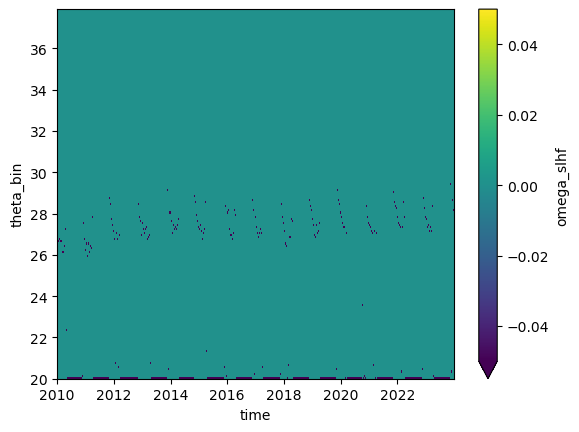

In [86]:
(mt_era_hist.omega_slhf/1e6).T.plot(vmin=0)

In [93]:
mt_era_hist

<xarray.Dataset> Size: 29MB
Dimensions:     (time: 5113, theta_bin: 179)
Coordinates:
  * time        (time) datetime64[ns] 41kB 2010-01-01 2010-01-02 ... 2023-12-31
  * theta_bin   (theta_bin) float64 1kB 20.05 20.15 20.25 ... 37.65 37.75 37.85
Data variables:
    omega_slhf  (time, theta_bin) float64 7MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    omega_sshf  (time, theta_bin) float64 7MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    omega_ssr   (time, theta_bin) float64 7MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    omega_str   (time, theta_bin) float64 7MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0

<Figure size 2500x500 with 0 Axes>

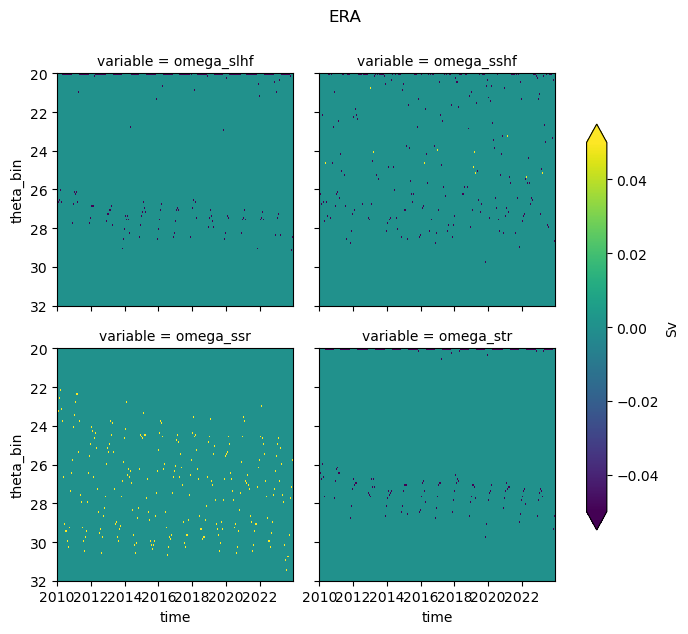

In [99]:
plt.figure(figsize=(25,5))
(mt_era_hist/1e6).sel(theta_bin=slice(20,32)).to_array().plot(col='variable', col_wrap=2, x='time', 
                               yincrease=False, robust=True,
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('ERA', y=1.05);

<Figure size 2500x500 with 0 Axes>

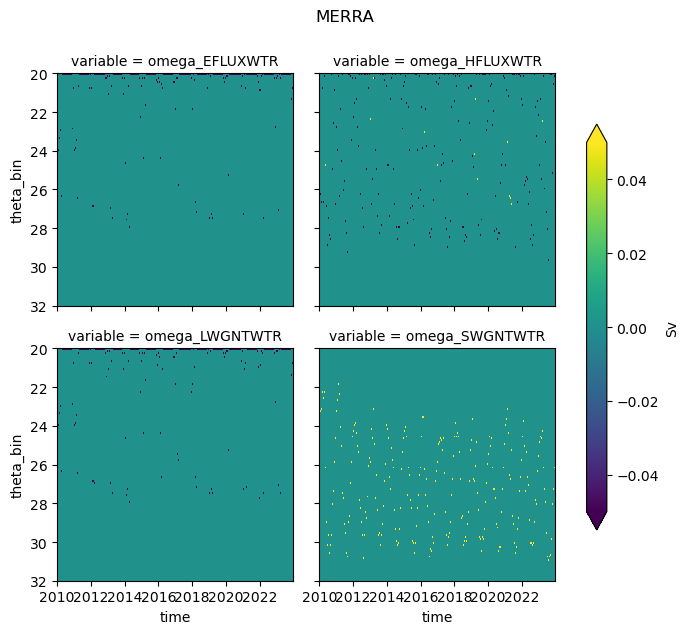

In [98]:
plt.figure(figsize=(25,5))
(mt_merra_hist/1e6).sel(theta_bin=slice(20,32)).to_array().plot(col='variable', col_wrap=2, x='time', 
                               yincrease=False, robust=True, 
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('MERRA', y=1.05);

<Figure size 2500x500 with 0 Axes>

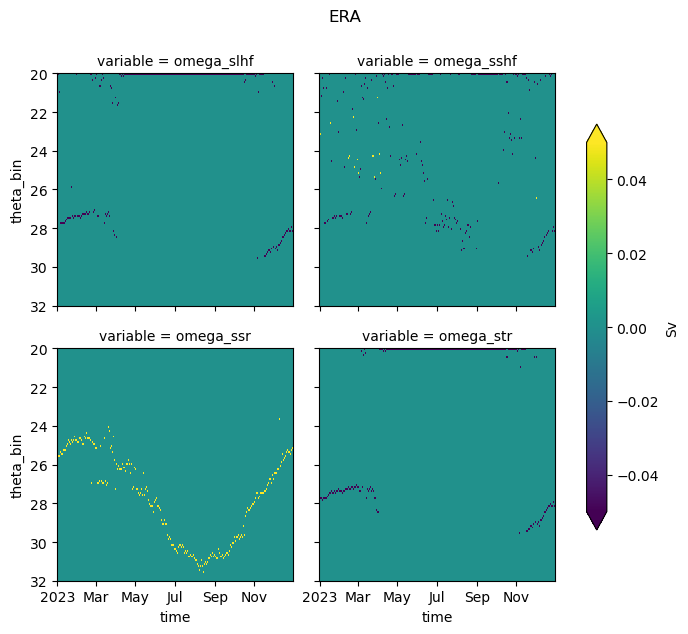

In [100]:
plt.figure(figsize=(25,5))
(mt_era_hist/1e6).sel(theta_bin=slice(20,32), time=slice('2023', '2023')).to_array().plot(col='variable', col_wrap=2, x='time', 
                               yincrease=False, robust=True,
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('ERA', y=1.05);

<Figure size 2500x500 with 0 Axes>

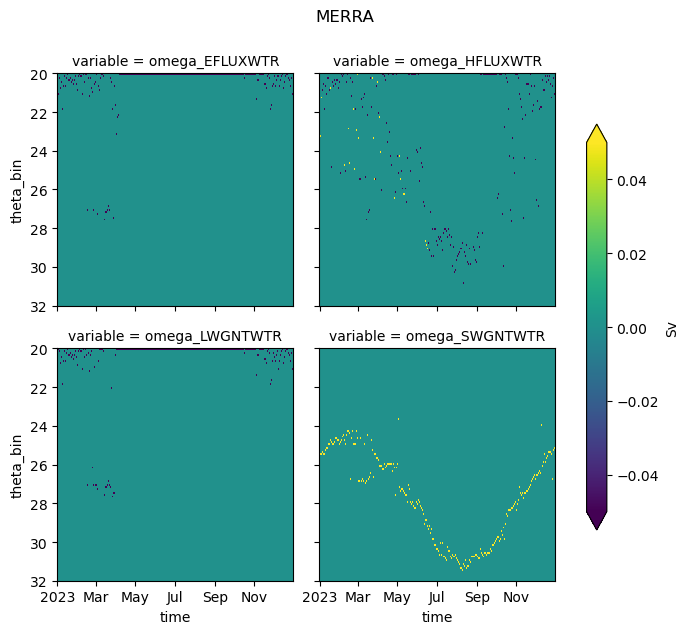

In [101]:
plt.figure(figsize=(25,5))
(mt_merra_hist/1e6).sel(theta_bin=slice(20,32), time=slice('2023', '2023')).to_array().plot(col='variable', 
                                                                                            col_wrap=2, x='time', 
                               yincrease=False, robust=True, 
                               cbar_kwargs={'shrink': 0.8, 'label':'Sv'})
plt.suptitle('MERRA', y=1.05);

### Select 31.8˚ isotherm

In [36]:
#check to see how many times wwm==31.8˚C occured 
one_plt_era = era_hist.sel(theta_bin=31.8, method='nearest')
one_plt_merra = merra_hist.sel(theta_bin=31.8, method='nearest')

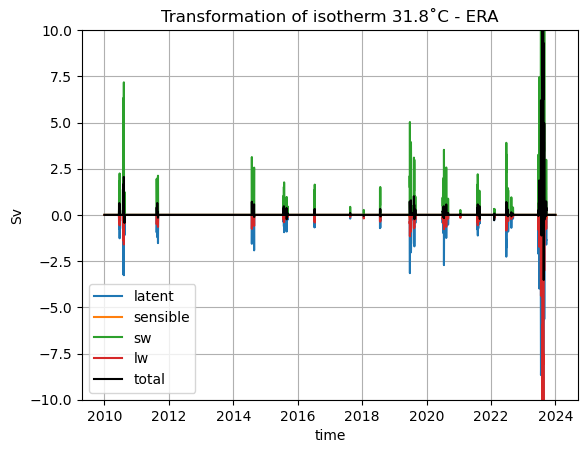

In [37]:
(one_plt_era.omega_slhf/1e6).plot(label='latent')
(one_plt_era.omega_sshf/1e6).plot(label='sensible')
(one_plt_era.omega_ssr/1e6).plot(label='sw')
(one_plt_era.omega_str/1e6).plot(label='lw')
(one_plt_era/1e6).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - ERA');

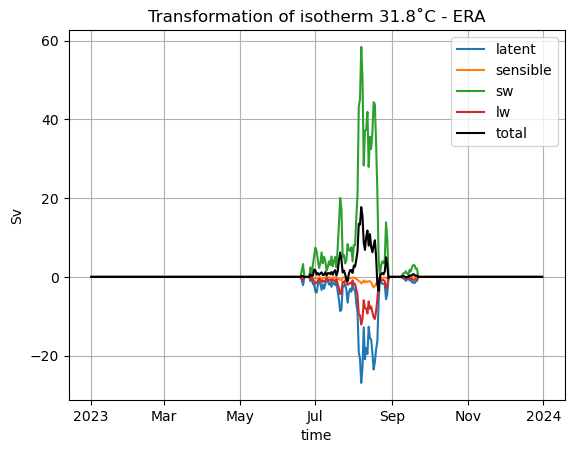

In [49]:
years = dict(time=slice('2023', '2023'))
(one_plt_era.omega_slhf/1e6).sel(**years).plot(label='latent')
(one_plt_era.omega_sshf/1e6).sel(**years).plot(label='sensible')
(one_plt_era.omega_ssr/1e6).sel(**years).plot(label='sw')
(one_plt_era.omega_str/1e6).sel(**years).plot(label='lw')
(one_plt_era/1e6).sel(**years).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
#plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - ERA');

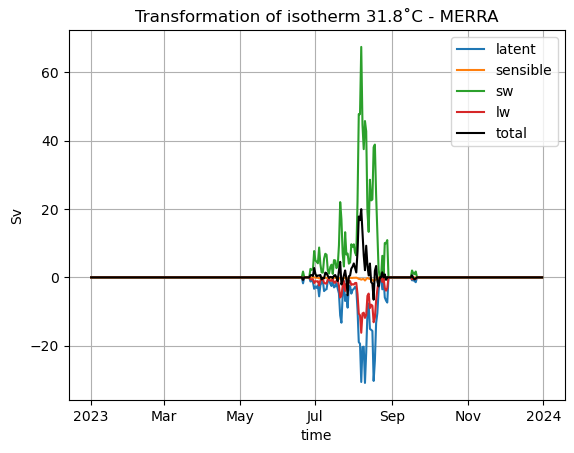

In [50]:
years = dict(time=slice('2023', '2023'))
(one_plt_merra.omega_EFLUXWTR/1e6).sel(**years).plot(label='latent')
(one_plt_merra.omega_HFLUXWTR/1e6).sel(**years).plot(label='sensible')
(one_plt_merra.omega_SWGNTWTR/1e6).sel(**years).plot(label='sw')
(one_plt_merra.omega_LWGNTWTR/1e6).sel(**years).plot(label='lw')
(one_plt_merra/1e6).sel(**years).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
#plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - MERRA');

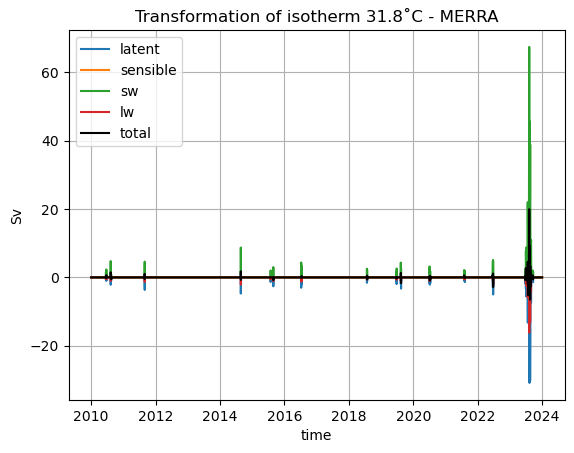

In [29]:
(one_plt_merra.omega_EFLUXWTR/1e6).plot(label='latent')
(one_plt_merra.omega_HFLUXWTR/1e6).plot(label='sensible')
(one_plt_merra.omega_SWGNTWTR/1e6).plot(label='sw')
(one_plt_merra.omega_LWGNTWTR/1e6).plot(label='lw')
(one_plt_merra/1e6).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
#plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - MERRA');

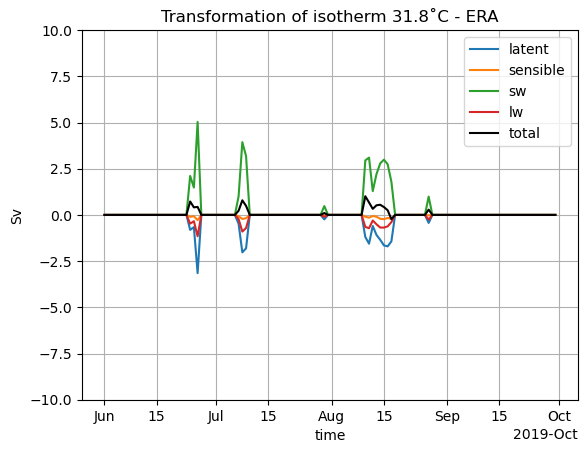

In [101]:
years = dict(time=slice('2019-06', '2019-09'))
(one_plt_era.omega_slhf/1e6).sel(**years).plot(label='latent')
(one_plt_era.omega_sshf/1e6).sel(**years).plot(label='sensible')
(one_plt_era.omega_ssr/1e6).sel(**years).plot(label='sw')
(one_plt_era.omega_str/1e6).sel(**years).plot(label='lw')
(one_plt_era/1e6).sel(**years).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - ERA');

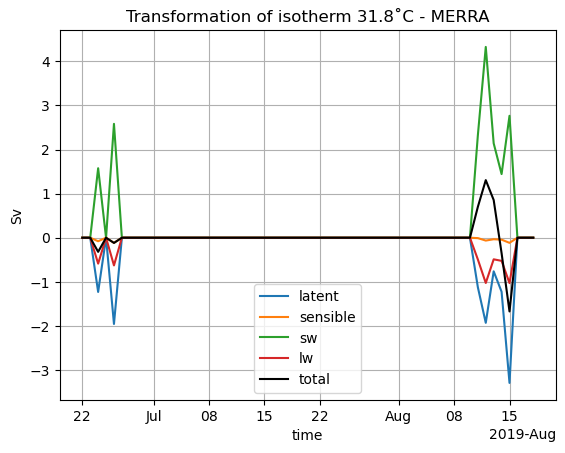

In [102]:
years = dict(time=slice('2019-06-22', '2019-08-18'))
(one_plt_merra.omega_EFLUXWTR/1e6).sel(**years).plot(label='latent')
(one_plt_merra.omega_HFLUXWTR/1e6).sel(**years).plot(label='sensible')
(one_plt_merra.omega_SWGNTWTR/1e6).sel(**years).plot(label='sw')
(one_plt_merra.omega_LWGNTWTR/1e6).sel(**years).plot(label='lw')
(one_plt_merra/1e6).sel(**years).to_array().sum('variable').plot(label='total', color='k')
plt.legend()
plt.ylabel('Sv')
#plt.ylim(-10,10)
plt.grid()
plt.title('Transformation of isotherm 31.8˚C - MERRA');

## Make tranformation movies!

In [49]:
from xmovie import Movie
%matplotlib inline

In [50]:
def plot_sw(da, fig, tt, *args, **kwargs):
    
    ax = fig.subplots()
    transformation = (da/1e6).isel(time=tt).plot(ax=ax)
    plt.grid()
    plt.ylim(0, 150)
    plt.xlim(20,36);
    
    return ax, transformation

(<Axes: title={'center': 'time = 2010-04-11'}, xlabel='theta_bin', ylabel='omega_SWGNTWTR'>,
 [<matplotlib.lines.Line2D at 0x7e35f42ccd10>])

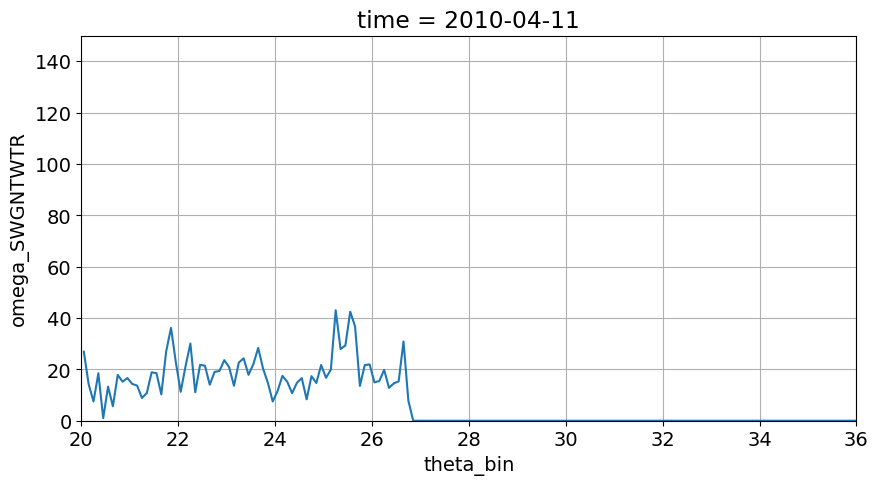

In [51]:
fig = plt.figure(figsize= (10, 5))
plot_sw(merra_hist.omega_SWGNTWTR, fig, 100)

In [52]:
sw_m = Movie(merra_hist.omega_SWGNTWTR.chunk({'time':1}), plot_sw, input_check=False)
sw_e = Movie(era_hist.omega_ssr.chunk({'time':1}), plot_sw, input_check=False)

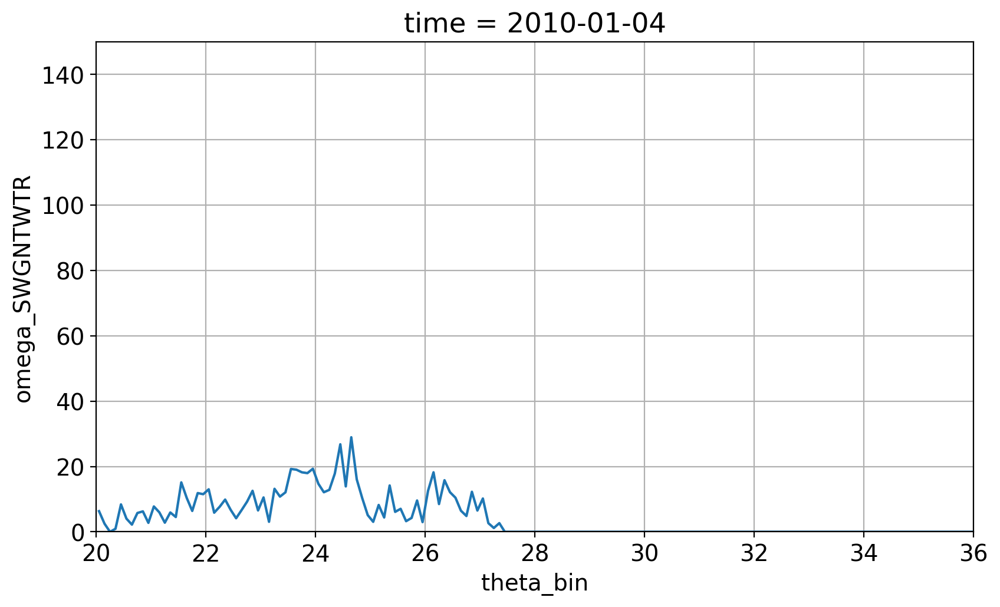

In [53]:
sw_m.preview(3)

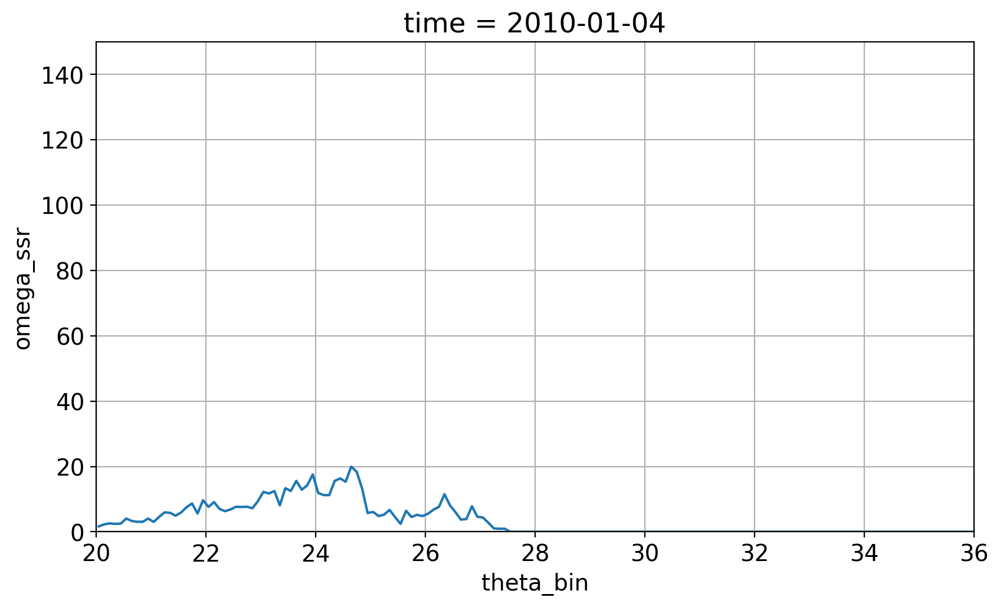

In [54]:
sw_e.preview(3)

In [65]:
sw_m.save('sw_m.mp4', parallel=True, overwrite_existing=True, progress=True,
         parallel_compute_kwargs=dict(scheduler="processes", num_workers=8))

Movie created at sw_m.mp4


In [67]:
sw_e.save('sw_e.mp4', parallel=True, overwrite_existing=True, progress=True,
         parallel_compute_kwargs=dict(scheduler="processes", num_workers=8))

Movie created at sw_e.mp4


# Save histograms

In [128]:
#uploading histograms
import json
import gcsfs

with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)


gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/hist_ds-glorys_sst.zarr')
era_hist.to_zarr(gcsmap_ds, mode='w')

In [41]:
gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/MERRA2/datasets/hist_ds_updated.zarr')
merra_hist.to_zarr(gcsmap_ds, mode='w')

In [149]:
#uploading sst-clim histograms
import json
import gcsfs

with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)


gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/hist_ds_sst-clim_glorys_sst.zarr')
hist_sst_dai_clim_e.chunk({'time':-1, 'theta_bin':-1}).to_zarr(gcsmap_ds, mode='w')

In [68]:
#uploading sst-clim histograms
gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/MERRA2/datasets/hist_ds_sst-clim.zarr')
hist_sst_dai_clim_m.to_zarr(gcsmap_ds, mode='w')

In [163]:
#uploading fluxes-clim histograms
hist_clim_dFlxdz = hist_flx_clim_dFlxdz.to_dataset(name='omega_ssrz')
gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/hist_ds_flx-clim_glorys_sst.zarr')
era_hist_flx_clim.chunk({'time':-1, 'theta_bin':-1}).to_zarr(gcsmap_ds, mode='w')

In [71]:
#uploading flx-clim histograms
gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/MERRA2/datasets/hist_ds_flx-clim.zarr')
merra_hist_flx_clim.to_zarr(gcsmap_ds, mode='w')

In [41]:
#uploading 
import json
import gcsfs

with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)

In [86]:
#uploading sst_fluxes-clim histogram
hist_dai_clim_dFdz = hist_dai_clim_dFlxdz.to_dataset(name='omega_ssrz')
gcsmap_ds = gcfs_w_token.get_mapper('pangeo-tmp/stb2145/ERA5/datasets/hist_ds_sst_flx-clim_ssrz.zarr')
hist_dai_clim_dFdz.to_zarr(gcsmap_ds, mode='w')